In [3]:
import xarray as xr
import numpy as np
import netCDF4
from matplotlib import pyplot as plt

In [4]:
import cartopy
import cartopy.crs as ccrs
import matplotlib.colors as mcolors
import iris
import iris.quickplot as qplt
import pandas as pd
from scipy import stats
import cartopy.feature as cfeature

In [5]:
d18O_last_sw = xr.open_dataarray('/data/keeling/a/anayrp2/CESM/d18O_last.nc')

In [6]:
d18O_last_sw.load();

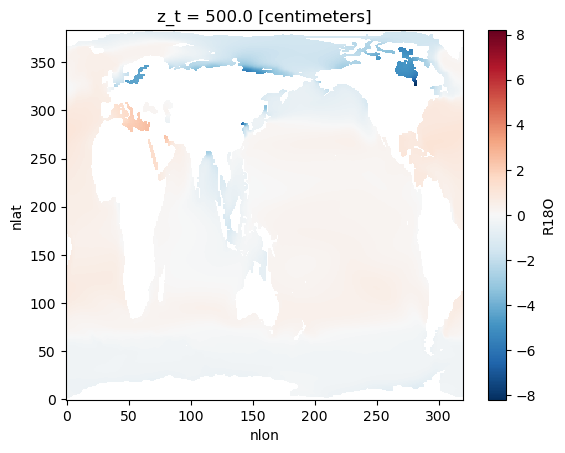

In [7]:
d18O_last_sw_mean = d18O_last_sw.sel(time=slice('1955','2005')).mean(dim='time')
d18O_last_sw_mean.plot()

In [8]:
d18O_a = d18O_last_sw_mean.drop('ULONG')
d18O_b = d18O_a.drop('ULAT')
d18O_b;

/data/keeling/a/anayrp2/miniconda3/envs/paleo/lib/python3.9/site-packages/iris/analysis/cartography.py:633: UserWarning: Coordinate system of latitude and longitude coordinates is not specified. Assuming WGS84 Geodetic.
  warnings.warn(


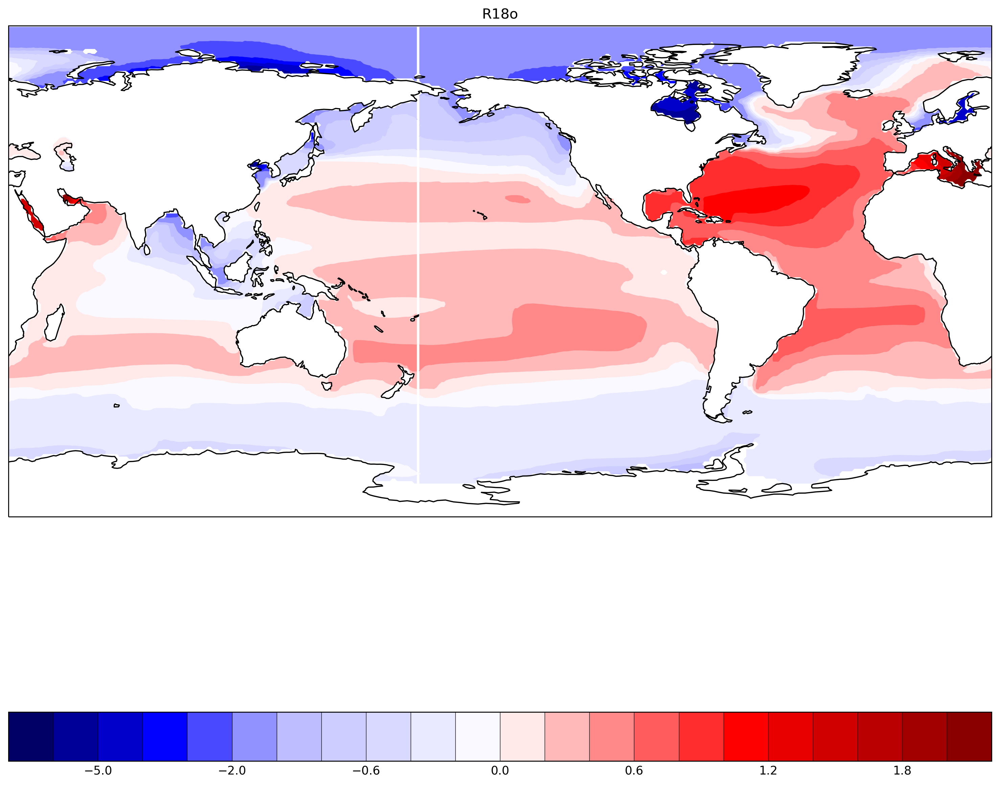

In [9]:
cube = d18O_b.to_iris()

pcarree = ccrs.PlateCarree()
new_cube, extent = iris.analysis.cartography.project(cube, pcarree,nx=400, ny=200)
fig = plt.figure(figsize=[15,20], dpi=250)
ax = plt.subplot(projection=ccrs.PlateCarree(central_longitude=-150.0))
ax.set_global()
ax.coastlines()
levels = [-7,-6, -5, -4 ,-3 ,-2, -1, -0.8, -0.6, -0.4, -0.2, 0, 0.2, 0.4, 0.6, 0.8, 1, 1.2, 1.4, 1.6, 1.8, 2, 2.2]
norm = mcolors.TwoSlopeNorm(vmin=levels[0], vmax=levels[-1], vcenter=0)

qplt.contourf(new_cube,cmap='seismic',levels=levels, norm=norm)
plt.show()

In [10]:
conroy = pd.read_csv('/data/keeling/a/anayrp2/CESM/palo20415-sup-0002-datas1.csv')

In [11]:
conroy.columns = conroy.columns.to_series().apply(lambda x: x.strip())
df = conroy[["Lon", "Lat", "Date", "Comments"]]
df.head();

In [12]:
df['Date']= pd.to_datetime(df['Date'])
df.dtypes

/tmp/ipykernel_24412/3248367058.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Date']= pd.to_datetime(df['Date'])


Lon                float64
Lat                float64
Date        datetime64[ns]
Comments            object
dtype: object

In [13]:
df.head()

,Lon,Lat,Date,Comments
0,147.428,-2.061,2013-05-02,PNG temporal data
1,147.428,-2.061,2013-05-03,PNG temporal data
2,147.428,-2.061,2013-05-04,PNG temporal data
3,147.428,-2.061,2013-05-05,PNG temporal data
4,147.428,-2.061,2013-05-07,PNG temporal data


In [14]:
df['DateNew'] = df['Date'].map(lambda x: pd.datetime(x.year - 10, x.month, x.day))
df.head()

/tmp/ipykernel_24412/3824998395.py:1: FutureWarning: The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.
  df['DateNew'] = df['Date'].map(lambda x: pd.datetime(x.year - 10, x.month, x.day))
/tmp/ipykernel_24412/3824998395.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['DateNew'] = df['Date'].map(lambda x: pd.datetime(x.year - 10, x.month, x.day))


,Lon,Lat,Date,Comments,DateNew
0,147.428,-2.061,2013-05-02,PNG temporal data,2003-05-02
1,147.428,-2.061,2013-05-03,PNG temporal data,2003-05-03
2,147.428,-2.061,2013-05-04,PNG temporal data,2003-05-04
3,147.428,-2.061,2013-05-05,PNG temporal data,2003-05-05
4,147.428,-2.061,2013-05-07,PNG temporal data,2003-05-07


In [15]:
df['year'] = pd.DatetimeIndex(df['DateNew']).year
df['month'] = pd.DatetimeIndex(df['DateNew']).month
df['month_year'] = pd.to_datetime(df['DateNew']).dt.to_period('M')
df.head()

/tmp/ipykernel_24412/2764596907.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['year'] = pd.DatetimeIndex(df['DateNew']).year
/tmp/ipykernel_24412/2764596907.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['month'] = pd.DatetimeIndex(df['DateNew']).month
/tmp/ipykernel_24412/2764596907.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.py

,Lon,Lat,Date,Comments,DateNew,year,month,month_year
0,147.428,-2.061,2013-05-02,PNG temporal data,2003-05-02,2003,5,2003-05
1,147.428,-2.061,2013-05-03,PNG temporal data,2003-05-03,2003,5,2003-05
2,147.428,-2.061,2013-05-04,PNG temporal data,2003-05-04,2003,5,2003-05
3,147.428,-2.061,2013-05-05,PNG temporal data,2003-05-05,2003,5,2003-05
4,147.428,-2.061,2013-05-07,PNG temporal data,2003-05-07,2003,5,2003-05


In [16]:
png = df.loc[df['Comments'] == 'PNG temporal data']
palau = df.loc[df['Comments'] == 'Palau temporal data']
kiri_s = df.loc[df['Comments'] == 'Kiritimati spatial data']
kiri_t = df.loc[df['Comments'] == 'Kiritimati ocean side temporal data']
gala_t = df.loc[df['Comments'] == 'Galapagos temporal data']
gala_s = df.loc[df['Comments'] == 'Galapagos spatial data']

In [17]:
png.set_index(['Lon', 'Lat', 'Date'])
palau.set_index(['Lon', 'Lat', 'Date'])
kiri_s.set_index(['Lon', 'Lat', 'Date'])
kiri_t.set_index(['Lon', 'Lat', 'Date'])
gala_t.set_index(['Lon', 'Lat', 'Date'])
gala_s.set_index(['Lon', 'Lat', 'Date']);

In [18]:
png.dtypes

Lon                  float64
Lat                  float64
Date          datetime64[ns]
Comments              object
DateNew       datetime64[ns]
year                   int64
month                  int64
month_year         period[M]
dtype: object

In [19]:
locations = [png, palau, kiri_s, kiri_t, gala_t, gala_s]
for x in range(len(locations)):
    print(locations[x])

        Lon    Lat       Date           Comments    DateNew  year  month  \
0   147.428 -2.061 2013-05-02  PNG temporal data 2003-05-02  2003      5   
1   147.428 -2.061 2013-05-03  PNG temporal data 2003-05-03  2003      5   
2   147.428 -2.061 2013-05-04  PNG temporal data 2003-05-04  2003      5   
3   147.428 -2.061 2013-05-05  PNG temporal data 2003-05-05  2003      5   
4   147.428 -2.061 2013-05-07  PNG temporal data 2003-05-07  2003      5   
5   147.428 -2.061 2013-05-13  PNG temporal data 2003-05-13  2003      5   
6   147.428 -2.061 2013-05-21  PNG temporal data 2003-05-21  2003      5   
7   147.428 -2.061 2013-05-29  PNG temporal data 2003-05-29  2003      5   
8   147.428 -2.061 2013-06-04  PNG temporal data 2003-06-04  2003      6   
9   147.428 -2.061 2013-06-11  PNG temporal data 2003-06-11  2003      6   
10  147.428 -2.061 2013-06-18  PNG temporal data 2003-06-18  2003      6   
11  147.428 -2.061 2013-06-25  PNG temporal data 2003-06-25  2003      6   
12  147.428 

In [20]:
for x in range(len(locations)):
    locations[x].time_min = locations[x].month_year.min()
    locations[x].time_max = locations[x].month_year.max()

In [21]:
for x in range(len(locations)):
    print(locations[x].time_min, locations[x].time_max)

2003-05 2004-07
2003-02 2004-11
2002-05 2003-08
2003-08 2004-08
2002-10 2005-01
2002-09 2005-01


In [22]:
png_d18O = d18O_last_sw.sel(time=slice('2003-05', '2004-07'))
palau_d18O = d18O_last_sw.sel(time=slice('2003-02', '2004-11'))
kiri_s_d18O = d18O_last_sw.sel(time=slice('2002-05', '2003-08'))
kiri_t_d18O = d18O_last_sw.sel(time=slice('2003-08', '2004-08'))
gala_t_d18O = d18O_last_sw.sel(time=slice('2002-10', '2005-01'))
gala_s_d18O = d18O_last_sw.sel(time=slice('2002-09', '2005-01'))

In [23]:
def pluck_data(ds,lon_target,lat_target):
    ind_lat=np.argmin(np.abs(ds.TLAT[:,0].values-lat_target))
    ind_lon=np.argmin(np.abs(ds.TLONG[0,:].values-lon_target))
    return ds[:,ind_lat,ind_lon]

# def pluck_spatial(ds,lon_target,lat_target):
#     ind_lat=np.argmin(np.abs(ds.TLAT[:,0].values-lat_target))
#     ind_lon=np.argmin(np.abs(ds.TLONG[0,:].values-lon_target))
    
    
#     d18_list=[]
#     salt_list=[]
    
#     for ilat in ind_lat-5:ind_lat+5
#         for ilon in ind_lon-5:ind_lat+5
#             ds[-1,ilat,ilon].salinit
#             ds[-1,ilat,ilon].d18
        
            # if its not NAm append the salinity to the salinit list and a[[end d18 to the d18 list
    #convert the lists into an array 
    #estimate slope and intercept
            
            
            
    

In [24]:
lat_target=-2.061
lon_target=147.428
png_d18O_data=pluck_data(png_d18O,lon_target,lat_target)

In [25]:
lat_target = 7.317
lon_target = 134.461 
palau_d18O_data= pluck_data(palau_d18O, lon_target, lat_target)

In [26]:
kiri_s_d18O_data = []
for i in range(139,162):
    lon_target = kiri_s['Lon']
    lat_target = kiri_s['Lat']
    kiri_s_d18O_data.append(pluck_data(kiri_s_d18O, lon_target[i], lat_target[i]))
kiri_s_d18O_data_f = list(np.concatenate(kiri_s_d18O_data).flat)

In [27]:
lat_target = 2.0
lon_target = -157.483
kiri_t_d18O_data= pluck_data(kiri_t_d18O, lon_target, lat_target)

In [28]:
lat_target = -0.744
lon_target = -90.303
gala_t_d18O_data= pluck_data(gala_t_d18O, lon_target, lat_target)

In [29]:
gala_s_d18O_data = []
for i in range(328,465):
    lon_target = gala_s['Lon']
    lat_target = gala_s['Lat']
    gala_s_d18O_data.append(pluck_data(gala_s_d18O, lon_target[i], lat_target[i]))
gala_s_d18O_data_f = list(np.concatenate(gala_s_d18O_data).flat)

In [30]:
salt_last_sw = xr.open_dataarray('/data/keeling/a/anayrp2/CESM/salt_last.nc')

In [31]:
salt_last_sw.load();

In [32]:
png_salt = salt_last_sw.sel(time=slice('2003-05', '2004-07'))
palau_salt = salt_last_sw.sel(time=slice('2003-02', '2004-11'))
kiri_s_salt = salt_last_sw.sel(time=slice('2002-05', '2003-08'))
kiri_t_salt = salt_last_sw.sel(time=slice('2003-08', '2004-08'))
gala_t_salt = salt_last_sw.sel(time=slice('2002-10', '2005-01'))
gala_s_salt = salt_last_sw.sel(time=slice('2002-09', '2005-01'))

In [33]:
lat_target=-2.061
lon_target=147.428
png_salt_data=pluck_data(png_salt,lon_target,lat_target)

In [34]:
lat_target = 7.317
lon_target = 134.461 
palau_salt_data= pluck_data(palau_salt, lon_target, lat_target)

In [35]:
kiri_s_salt_data = []
for i in range(139,162):
    lon_target = kiri_s['Lon']
    lat_target = kiri_s['Lat']
    kiri_s_salt_data.append(pluck_data(kiri_s_salt, lon_target[i], lat_target[i]))
kiri_s_salt_data_f = list(np.concatenate(kiri_s_salt_data).flat)

In [36]:
lat_target = 2.0
lon_target = -157.483
kiri_t_salt_data= pluck_data(kiri_t_salt, lon_target, lat_target)

In [37]:
lat_target = -0.744
lon_target = -90.303
gala_t_salt_data= pluck_data(gala_t_salt, lon_target, lat_target)

In [38]:
gala_s_salt_data = []
for i in range(328,465):
    lon_target = gala_s['Lon']
    lat_target = gala_s['Lat']
    gala_s_salt_data.append(pluck_data(gala_s_salt, lon_target[i], lat_target[i]))
gala_s_salt_data_f = list(np.concatenate(gala_s_salt_data).flat)

In [39]:
kiri_s_salt_data_fa = np.array(kiri_s_salt_data_f)
kiri_s_d18O_data_fa = np.array(kiri_s_d18O_data_f)
gala_s_salt_data_fa = np.array(gala_s_salt_data_f)
gala_s_d18O_data_fa = np.array(gala_s_d18O_data_f)

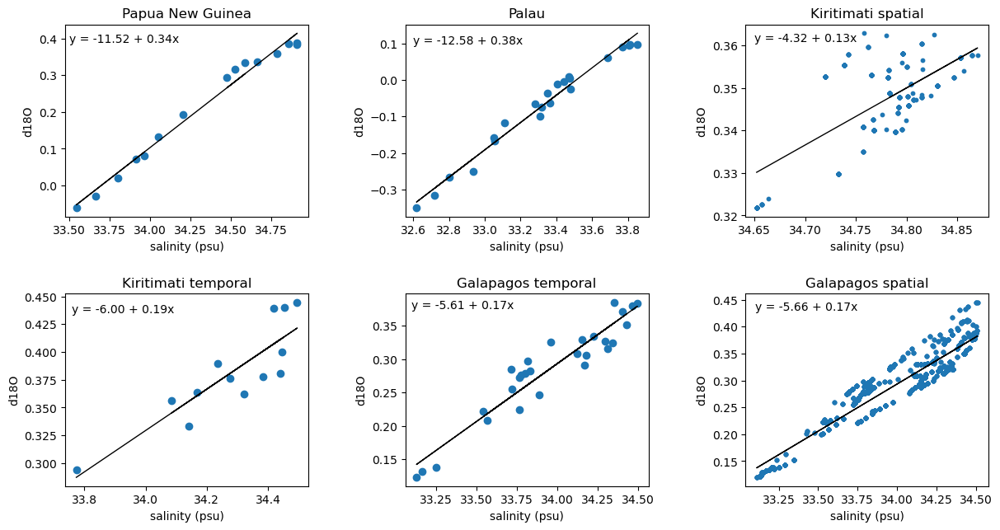

In [40]:
plt.figure(figsize=(14,7))

plt.subplot(2,3,1)
plt.scatter(png_salt_data,png_d18O_data)
plt.xlabel("salinity (psu)")
plt.ylabel("d18O")
plt.title("Papua New Guinea")
a, b = np.polyfit(png_salt_data,png_d18O_data,1)
plt.plot(png_salt_data, a*png_salt_data+b, color='black', linestyle='-', linewidth=1)
plt.text(33.5, 0.39, 'y = ' + '{:.2f}'.format(b) + ' + {:.2f}'.format(a) + 'x', size=10)

plt.subplot(2,3,2)
plt.scatter(palau_salt_data,palau_d18O_data)
plt.xlabel("salinity (psu)")
plt.ylabel("d18O")
plt.title("Palau")
a, b = np.polyfit(palau_salt_data,palau_d18O_data,1)
plt.plot(palau_salt_data, a*palau_salt_data+b, color='black', linestyle='-', linewidth=1)
plt.text(32.6, 0.1, 'y = ' + '{:.2f}'.format(b) + ' + {:.2f}'.format(a) + 'x', size=10)

plt.subplot(2,3,3)
plt.scatter(kiri_s_salt_data_f,kiri_s_d18O_data_f, s=10)
plt.xlabel("salinity (psu)")
plt.ylabel("d18O")
plt.title("Kiritimati spatial")
a, b = np.polyfit(kiri_s_salt_data_fa,kiri_s_d18O_data_fa,1)
plt.plot(kiri_s_salt_data_fa, a*kiri_s_salt_data_fa+b, color='black', linestyle='-', linewidth=1)
plt.text(34.65, 0.361, 'y = ' + '{:.2f}'.format(b) + ' + {:.2f}'.format(a) + 'x', size=10)

plt.subplot(2,3,4)
plt.scatter(kiri_t_salt_data,kiri_t_d18O_data)
plt.xlabel("salinity (psu)")
plt.ylabel("d18O")
plt.title("Kiritimati temporal")
a, b = np.polyfit(kiri_t_salt_data,kiri_t_d18O_data,1)
plt.plot(kiri_t_salt_data, a*kiri_t_salt_data+b, color='black', linestyle='-', linewidth=1)
plt.text(33.76, 0.435, 'y = ' + '{:.2f}'.format(b) + ' + {:.2f}'.format(a) + 'x', size=10)

plt.subplot(2,3,5)
plt.scatter(gala_t_salt_data,gala_t_d18O_data)
plt.xlabel("salinity (psu)")
plt.ylabel("d18O")
plt.title("Galapagos temporal")
a, b = np.polyfit(gala_t_salt_data,gala_t_d18O_data,1)
plt.plot(gala_t_salt_data, a*gala_t_salt_data+b, color='black', linestyle='-', linewidth=1)
plt.text(33.10, 0.375, 'y = ' + '{:.2f}'.format(b) + ' + {:.2f}'.format(a) + 'x', size=10)

plt.subplot(2,3,6)
plt.scatter(gala_s_salt_data_f,gala_s_d18O_data_f,s = 10)
plt.xlabel("salinity (psu)")
plt.ylabel("d18O")
plt.title("Galapagos spatial")
a, b = np.polyfit(gala_s_salt_data_fa,gala_s_d18O_data_fa,1)
plt.plot(gala_s_salt_data_fa, a*gala_s_salt_data_fa+b, color='black', linestyle='-', linewidth=1)
plt.text(33.1, 0.43, 'y = ' + '{:.2f}'.format(b) + ' + {:.2f}'.format(a) + 'x', size=10)

plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.4, 
                    hspace=0.4)
plt.show()

In [41]:
d18O_mil = xr.open_dataarray('/data/keeling/a/anayrp2/CESM/d18O_mil.nc')

In [42]:
salt_mil = xr.open_dataarray('/data/keeling/a/anayrp2/CESM/salt_mil.nc')

In [43]:
d18O_mil.load();

In [44]:
salt_mil.load();

In [45]:
lat_target=-2.061
lon_target=147.428
png_d18O_mil =pluck_data(d18O_mil,lon_target,lat_target)

In [46]:
lat_target=-2.061
lon_target=147.428
png_salt_mil=pluck_data(salt_mil,lon_target,lat_target)

In [47]:
lat_target = 7.317
lon_target = 134.461 
palau_d18O_mil= pluck_data(d18O_mil, lon_target, lat_target)

In [48]:
lat_target = 7.317
lon_target = 134.461 
palau_salt_mil= pluck_data(salt_mil, lon_target, lat_target)

In [49]:
lat_target = 2.0
lon_target = -157.483
kiri_t_d18O_mil= pluck_data(d18O_mil, lon_target, lat_target)

In [50]:
lat_target = 2.0
lon_target = -157.483
kiri_t_salt_mil= pluck_data(salt_mil, lon_target, lat_target)

In [51]:
lat_target = -0.744
lon_target = -90.303
gala_t_d18O_mil= pluck_data(d18O_mil, lon_target, lat_target)

In [52]:
lat_target = -0.744
lon_target = -90.303
gala_t_salt_mil= pluck_data(salt_mil, lon_target, lat_target)

In [53]:
kiri_s_d18O_mil = []
for i in range(139,162):
    lon_target = kiri_s['Lon']
    lat_target = kiri_s['Lat']
    kiri_s_d18O_mil.append(pluck_data(d18O_mil, lon_target[i], lat_target[i]))
kiri_s_d18O_mil_f = list(np.concatenate(kiri_s_d18O_mil).flat)

In [54]:
kiri_s_salt_mil = []
for i in range(139,162):
    lon_target = kiri_s['Lon']
    lat_target = kiri_s['Lat']
    kiri_s_salt_mil.append(pluck_data(salt_mil, lon_target[i], lat_target[i]))
kiri_s_salt_mil_f = list(np.concatenate(kiri_s_salt_mil).flat)

In [55]:
gala_s_d18O_mil = []
for i in range(328,465):
    lon_target = gala_s['Lon']
    lat_target = gala_s['Lat']
    gala_s_d18O_mil.append(pluck_data(d18O_mil, lon_target[i], lat_target[i]))
gala_s_d18O_mil_f = list(np.concatenate(gala_s_d18O_mil).flat)

In [56]:
gala_s_salt_mil = []
for i in range(328,465):
    lon_target = gala_s['Lon']
    lat_target = gala_s['Lat']
    gala_s_salt_mil.append(pluck_data(salt_mil, lon_target[i], lat_target[i]))
gala_s_salt_mil_f = list(np.concatenate(gala_s_salt_mil).flat)

In [57]:
kiri_s_salt_mil_fa = np.array(kiri_s_salt_mil_f)
kiri_s_d18O_mil_fa = np.array(kiri_s_d18O_mil_f)
gala_s_salt_mil_fa = np.array(gala_s_salt_mil_f)
gala_s_d18O_mil_fa = np.array(gala_s_d18O_mil_f)

In [58]:
#kiri_out = stats.linregress(kiri_s_d18O_mil_fa,kiri_s_salt_mil_fa)
#gala_out = stats.linregress(gala_s_d18O_mil_fa,gala_s_salt_mil_fa)

(0.05, 0.5)

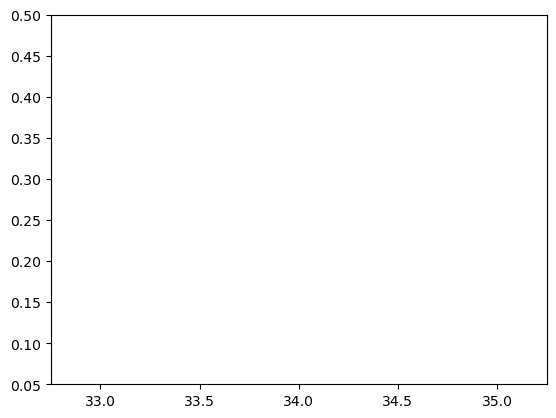

In [59]:
(35.25 - ((35.25-32.75)*0.9))
(35.25 - ((35.25-32.75)*0.5))

(0.55 - ((0.55)*0.1))
(0.55 - ((0.55)*0.9))

plt.xlim(32.75,35.25)
plt.ylim(0.05,0.5)

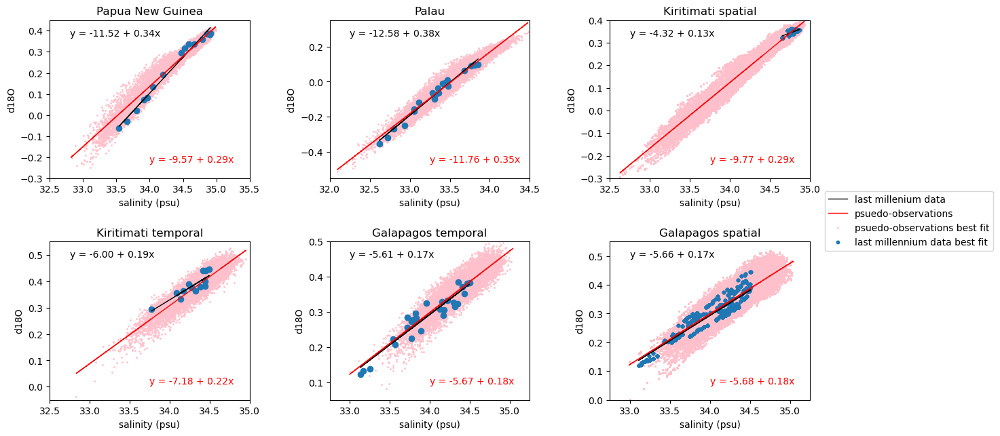

In [60]:
kiri_out = stats.linregress(kiri_s_salt_mil_fa,kiri_s_d18O_mil_fa)
gala_out = stats.linregress(gala_s_salt_mil_fa,gala_s_d18O_mil_fa)
plt.figure(figsize=(14,7))

plt.subplot(2,3,1)
plt.scatter(png_salt_mil,png_d18O_mil,color='pink',s=1)
plt.scatter(png_salt_data,png_d18O_data)
plt.xlabel("salinity (psu)")
plt.ylabel("d18O")
plt.title("Papua New Guinea")
a, b = np.polyfit(png_salt_data,png_d18O_data,1)
plt.plot(png_salt_data, a*png_salt_data+b, color='black', linestyle='-', linewidth=1)
plt.text((35.5 - ((35.5-32.5)*0.9)),(0.45 - ((0.45+0.3)*0.1)), 'y = ' + '{:.2f}'.format(b) + ' + {:.2f}'.format(a) + 'x', size=10)
c, d = np.polyfit(png_salt_mil,png_d18O_mil,1)
plt.plot(png_salt_mil, c*png_salt_mil+d, color='red', linestyle='-', linewidth=1)
plt.text((35.5 - ((35.5-32.5)*0.5)),(0.45 - ((0.45+0.3)*0.9)), 'y = ' + '{:.2f}'.format(d) + ' + {:.2f}'.format(c) + 'x', size=10,color='red')
plt.xlim(32.5,35.5)
plt.ylim(-0.3,0.45)

plt.subplot(2,3,2)
plt.scatter(palau_salt_mil,palau_d18O_mil,color='pink',s=1)
plt.scatter(palau_salt_data,palau_d18O_data)
plt.xlabel("salinity (psu)")
plt.ylabel("d18O")
plt.title("Palau")
a, b = np.polyfit(palau_salt_data,palau_d18O_data,1)
plt.plot(palau_salt_data, a*palau_salt_data+b, color='black', linestyle='-', linewidth=1)
plt.text((34.5 - ((34.5-32)*0.9)), (0.35 - ((0.35+0.55)*0.1)), 'y = ' + '{:.2f}'.format(b) + ' + {:.2f}'.format(a) + 'x', size=10)
c, d = np.polyfit(palau_salt_mil,palau_d18O_mil,1)
plt.plot(palau_salt_mil, c*palau_salt_mil+d, color='red', linestyle='-', linewidth=1)
plt.text((34.5 - ((34.5-32)*0.5)), (0.35 - ((0.35+0.55)*0.9)), 'y = ' + '{:.2f}'.format(d) + ' + {:.2f}'.format(c) + 'x', size=10,color='red')
plt.xlim(32,34.5)
plt.ylim(-0.55,0.35)

plt.subplot(2,3,3)
plt.scatter(kiri_s_salt_mil,kiri_s_d18O_mil,color='pink',s=1)
plt.scatter(kiri_s_salt_data_f,kiri_s_d18O_data_f, s=10)
plt.xlabel("salinity (psu)")
plt.ylabel("d18O")
plt.title("Kiritimati spatial")
a, b = np.polyfit(kiri_s_salt_data_fa,kiri_s_d18O_data_fa,1)
plt.plot(kiri_s_salt_data_fa, a*kiri_s_salt_data_fa+b, color='black', linestyle='-', linewidth=1)
plt.text((35 - ((35-32.5)*0.9)), (0.4 - ((0.4+0.3)*0.1)), 'y = ' + '{:.2f}'.format(b) + ' + {:.2f}'.format(a) + 'x', size=10)
#c, d = np.polyfit(kiri_s_salt_mil_fa,kiri_s_d18O_mil_fa,1)
c = kiri_out.slope
d = kiri_out.intercept
plt.plot(kiri_s_salt_mil_fa, c*kiri_s_salt_mil_fa+d, color='red', linestyle='-', linewidth=1)
plt.text((35 - ((35-32.5)*0.5)), (0.4 - ((0.4+0.3)*0.9)), 'y = ' + '{:.2f}'.format(d) + ' + {:.2f}'.format(c) + 'x', size=10,color='red')
plt.xlim(32.5,35)
plt.ylim(-0.3,0.4)

plt.subplot(2,3,4)
plt.scatter(kiri_t_salt_mil,kiri_t_d18O_mil,color='pink',s=1)
plt.scatter(kiri_t_salt_data,kiri_t_d18O_data)
plt.xlabel("salinity (psu)")
plt.ylabel("d18O")
plt.title("Kiritimati temporal")
a, b = np.polyfit(kiri_t_salt_data,kiri_t_d18O_data,1)
plt.plot(kiri_t_salt_data, a*kiri_t_salt_data+b, color='black', linestyle='-', linewidth=1)
plt.text((35 - ((35-32.5)*0.9)), (0.55 - ((0.55+0.05)*0.1)), 'y = ' + '{:.2f}'.format(b) + ' + {:.2f}'.format(a) + 'x', size=10)
c, d = np.polyfit(kiri_t_salt_mil,kiri_t_d18O_mil,1)
plt.plot(kiri_t_salt_mil, c*kiri_t_salt_mil+d, color='red', linestyle='-', linewidth=1)
plt.text((35 - ((35-32.5)*0.5)), (0.55 - ((0.55+0.05)*0.9)), 'y = ' + '{:.2f}'.format(d) + ' + {:.2f}'.format(c) + 'x', size=10,color='red')
plt.xlim(32.5,35)
plt.ylim(-0.05,0.55)

plt.subplot(2,3,5)
plt.scatter(gala_t_salt_mil,gala_t_d18O_mil,color='pink',s=1)
plt.scatter(gala_t_salt_data,gala_t_d18O_data)
plt.xlabel("salinity (psu)")
plt.ylabel("d18O")
plt.title("Galapagos temporal")
a, b = np.polyfit(gala_t_salt_data,gala_t_d18O_data,1)
plt.plot(gala_t_salt_data, a*gala_t_salt_data+b, color='black', linestyle='-', linewidth=1)
plt.text((35.25 - ((35.25-32.75)*0.9)), (0.5 - ((0.5-0.05)*0.1)), 'y = ' + '{:.2f}'.format(b) + ' + {:.2f}'.format(a) + 'x', size=10)
c, d = np.polyfit(gala_t_salt_mil,gala_t_d18O_mil,1)
plt.plot(gala_t_salt_mil, c*gala_t_salt_mil+d, color='red', linestyle='-', linewidth=1)
plt.text((35.25 - ((35.25-32.75)*0.5)), (0.5 - ((0.5-0.05)*0.9)), 'y = ' + '{:.2f}'.format(d) + ' + {:.2f}'.format(c) + 'x', size=10,color='red')
plt.xlim(32.75,35.25)
plt.ylim(0.05,0.5)

plt.subplot(2,3,6)
plt.scatter(gala_s_salt_mil,gala_s_d18O_mil,color='pink',s=1)
plt.scatter(gala_s_salt_data_f,gala_s_d18O_data_f,s = 10)
plt.xlabel("salinity (psu)")
plt.ylabel("d18O")
plt.title("Galapagos spatial")
a, b = np.polyfit(gala_s_salt_data_fa,gala_s_d18O_data_fa,1)
plt.plot(gala_s_salt_data_fa, a*gala_s_salt_data_fa+b, color='black', linestyle='-', linewidth=1)
plt.text((35.25 - ((35.25-32.75)*0.9)), (0.55 - ((0.55)*0.1)), 'y = ' + '{:.2f}'.format(b) + ' + {:.2f}'.format(a) + 'x', size=10)
#c, d = np.polyfit(gala_s_salt_mil_fa,gala_s_d18O_mil_fa,1)
c = gala_out.slope
d = gala_out.intercept
plt.plot(gala_s_salt_mil_fa, c*gala_s_salt_mil_fa+d, color='red', linestyle='-', linewidth=1)
plt.text((35.25 - ((35.25-32.75)*0.5)), (0.55 - ((0.55)*0.9)), 'y = ' + '{:.2f}'.format(d) + ' + {:.2f}'.format(c) + 'x', size=10,color='red')
plt.xlim(32.75,35.25)
plt.ylim(0,0.55)

plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.4, 
                    hspace=0.4)
plt.legend(["last millenium data", "psuedo-observations",'psuedo-observations best fit','last millennium data best fit'],bbox_to_anchor=(1.05, 1.35),loc='upper left')

plt.show()


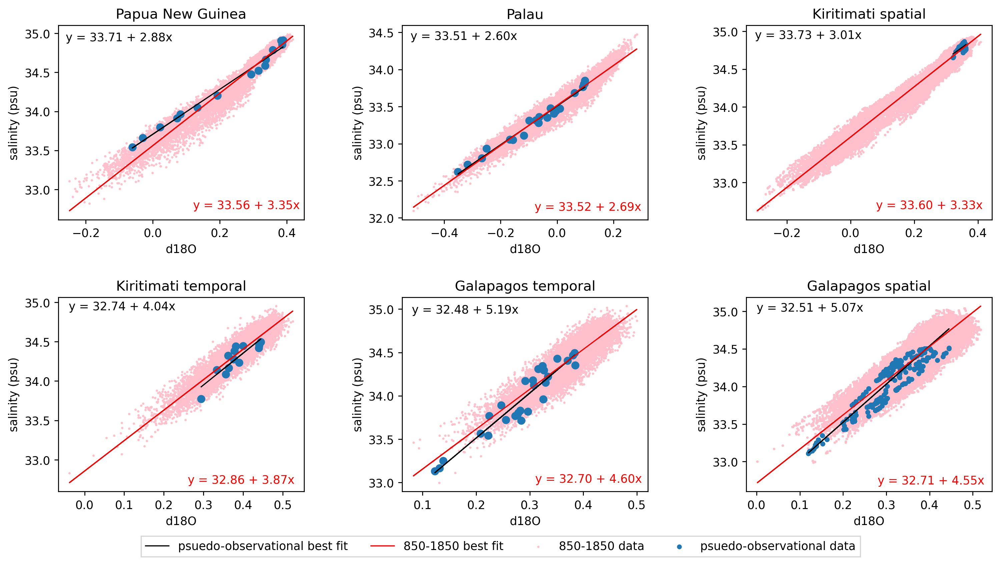

In [61]:
kiri_out = stats.linregress(kiri_s_d18O_mil_fa,kiri_s_salt_mil_fa)
gala_out = stats.linregress(gala_s_d18O_mil_fa,gala_s_salt_mil_fa)

plt.figure(figsize=(14,7), dpi=250)

plt.subplot(2,3,1)
plt.scatter(png_d18O_mil,png_salt_mil,color='pink',s=1)
plt.scatter(png_d18O_data,png_salt_data)
plt.xlabel("d18O")
plt.ylabel("salinity (psu)")
plt.title("Papua New Guinea")
a, b = np.polyfit(png_d18O_data,png_salt_data,1)
plt.plot(png_d18O_data, a*png_d18O_data+b, color='black', linestyle='-', linewidth=1)
plt.text(-0.26,34.9, 'y = ' + '{:.2f}'.format(b) + ' + {:.2f}'.format(a) + 'x', size=10)
c, d = np.polyfit(png_d18O_mil,png_salt_mil,1)
plt.plot(png_d18O_mil, c*png_d18O_mil+d, color='red', linestyle='-', linewidth=1)
plt.text(0.12,32.75, 'y = ' + '{:.2f}'.format(d) + ' + {:.2f}'.format(c) + 'x', size=10,color='red')

plt.subplot(2,3,2)
plt.scatter(palau_d18O_mil,palau_salt_mil,color='pink',s=1)
plt.scatter(palau_d18O_data,palau_salt_data)
plt.xlabel("d18O")
plt.ylabel("salinity (psu)")
plt.title("Palau")
a, b = np.polyfit(palau_d18O_data,palau_salt_data,1)
plt.plot(palau_d18O_data, a*palau_d18O_data+b, color='black', linestyle='-', linewidth=1)
plt.text(-0.52, 34.4, 'y = ' + '{:.2f}'.format(b) + ' + {:.2f}'.format(a) + 'x', size=10)
c, d = np.polyfit(palau_d18O_mil,palau_salt_mil,1)
plt.plot(palau_d18O_mil, c*palau_d18O_mil+d, color='red', linestyle='-', linewidth=1)
plt.text(-0.08,32.1, 'y = ' + '{:.2f}'.format(d) + ' + {:.2f}'.format(c) + 'x', size=10,color='red')

plt.subplot(2,3,3)
plt.scatter(kiri_s_d18O_mil,kiri_s_salt_mil,color='pink',s=1)
plt.scatter(kiri_s_d18O_data_f,kiri_s_salt_data_f, s=10)
plt.xlabel("d18O")
plt.ylabel("salinity (psu)")
plt.title("Kiritimati spatial")
a, b = np.polyfit(kiri_s_d18O_data_fa,kiri_s_salt_data_fa,1)
plt.plot(kiri_s_d18O_data_fa, a*kiri_s_d18O_data_fa+b, color='black', linestyle='-', linewidth=1)
plt.text( -0.3,34.9, 'y = ' + '{:.2f}'.format(b) + ' + {:.2f}'.format(a) + 'x', size=10)
#c, d = np.polyfit(kiri_s_salt_mil_fa,kiri_s_d18O_mil_fa,1)
c = kiri_out.slope
d = kiri_out.intercept
plt.plot(kiri_s_d18O_mil_fa, c*kiri_s_d18O_mil_fa+d, color='red', linestyle='-', linewidth=1)
plt.text( 0.08,32.65, 'y = ' + '{:.2f}'.format(d) + ' + {:.2f}'.format(c) + 'x', size=10,color='red')

plt.subplot(2,3,4)
plt.scatter(kiri_t_d18O_mil,kiri_t_salt_mil,color='pink',s=1)
plt.scatter(kiri_t_d18O_data,kiri_t_salt_data)
plt.xlabel("d18O")
plt.ylabel("salinity (psu)")
plt.title("Kiritimati temporal")
a, b = np.polyfit(kiri_t_d18O_data,kiri_t_salt_data,1)
plt.plot(kiri_t_d18O_data, a*kiri_t_d18O_data+b, color='black', linestyle='-', linewidth=1)
plt.text( -0.04,34.9, 'y = ' + '{:.2f}'.format(b) + ' + {:.2f}'.format(a) + 'x', size=10)
c, d = np.polyfit(kiri_t_d18O_mil,kiri_t_salt_mil,1)
plt.plot(kiri_t_d18O_mil, c*kiri_t_d18O_mil+d, color='red', linestyle='-', linewidth=1)
plt.text( 0.26,32.7, 'y = ' + '{:.2f}'.format(d) + ' + {:.2f}'.format(c) + 'x', size=10,color='red')

plt.subplot(2,3,5)
plt.scatter(gala_t_d18O_mil,gala_t_salt_mil,color='pink',s=1)
plt.scatter(gala_t_d18O_data,gala_t_salt_data)
plt.xlabel("d18O")
plt.ylabel("salinity (psu)")
plt.title("Galapagos temporal")
a, b = np.polyfit(gala_t_d18O_data,gala_t_salt_data,1)
plt.plot(gala_t_d18O_data, a*gala_t_d18O_data+b, color='black', linestyle='-', linewidth=1)
plt.text(0.08, 34.95, 'y = ' + '{:.2f}'.format(b) + ' + {:.2f}'.format(a) + 'x', size=10)
c, d = np.polyfit(gala_t_d18O_mil,gala_t_salt_mil,1)
plt.plot(gala_t_d18O_mil, c*gala_t_d18O_mil+d, color='red', linestyle='-', linewidth=1)
plt.text(0.31, 33, 'y = ' + '{:.2f}'.format(d) + ' + {:.2f}'.format(c) + 'x', size=10,color='red')

plt.subplot(2,3,6)
plt.scatter(gala_s_d18O_mil,gala_s_salt_mil,color='pink',s=1,label="850-1850 data")
plt.scatter(gala_s_d18O_data_f,gala_s_salt_data_f,s = 10,label="psuedo-observational data")
plt.xlabel("d18O")
plt.ylabel("salinity (psu)")
plt.title("Galapagos spatial")
a, b = np.polyfit(gala_s_d18O_data_fa,gala_s_salt_data_fa,1)
plt.plot(gala_s_d18O_data_fa, a*gala_s_d18O_data_fa+b, color='black', linestyle='-', linewidth=1,label="psuedo-observational best fit")
plt.text(0, 35, 'y = ' + '{:.2f}'.format(b) + ' + {:.2f}'.format(a) + 'x', size=10)
#c, d = np.polyfit(gala_s_salt_mil_fa,gala_s_d18O_mil_fa,1)
c = gala_out.slope
d = gala_out.intercept
plt.plot(gala_s_d18O_mil_fa, c*gala_s_d18O_mil_fa+d, color='red', linestyle='-', linewidth=1,label="850-1850 best fit")
plt.text(0.28, 32.7, 'y = ' + '{:.2f}'.format(d) + ' + {:.2f}'.format(c) + 'x', size=10,color='red')

plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.4, 
                    hspace=0.4)
#plt.legend(["last millenium data", "psuedo-observations",'psuedo-observations best fit','last millennium data best fit'],
#           bbox_to_anchor=(-1, -0.2),loc='upper center',fancybox=False, shadow=False, ncol=4)
plt.legend(bbox_to_anchor=(-1, -0.2),loc='upper center',fancybox=False, shadow=False, ncol=4)

plt.show()


In [62]:
corals = pd.read_csv('/data/keeling/a/anayrp2/CESM/iso2Kcoral_recordsThompson2022_fixed2.csv')

In [63]:
for col in corals.columns:
    print(col)

Number
geo_siteName
paleoData_iso2kUI
lat
lon
min year
max year
mean d18O
Fsw
Fcov
r, sss-sst
p, sss-sst
r d18Oc-SSS
p, d18Oc-SSS
partial r, d18Oc-SSS w/out SST
partial p, d18Oc-SSS w/out SST
slope z-score 1900-2009 (new)
paleoData_chronologyIntegrationTimeUnits
hasResolution_hasMeanValue
hasResolution_hasMedianValue
Unnamed: 20


In [64]:
corals_lats = []
corals_lon = []
corals_min_years = []
corals_max_years = []

In [65]:
for i in range(43):
    corals_lats = np.append(corals_lats, corals['lat'][i])

In [66]:
for i in range(43):
    corals_lon = np.append(corals_lon, corals['lon'][i])

In [67]:
for i in range(43):
    corals_min_years = np.append(corals_min_years, round(corals['min year'][i]))

In [68]:
for i in range(43):
    corals_max_years = np.append(corals_max_years, round(corals['max year'][i]))

In [69]:
corals_min_years_int = corals_min_years.astype(int)
corals_min_years_str = corals_min_years_int.astype(str)
corals_max_years_int = corals_max_years.astype(int)
corals_max_years_str = corals_max_years_int.astype(str)

In [70]:
corals_min_years_str;

In [71]:
for i in range(43):
    if len(corals_min_years_str[i]) < 4:
        corals_min_years_str[i] = '0' + corals_min_years_str[i]
corals_min_years_str

array(['1801', '1879', '1840', '1881', '1782', '1860', '1941', '1929',
       '1727', '1910', '1961', '1832', '1790', '1867', '1708', '1858',
       '1872', '1886', '1843', '1950', '1959', '1914', '1899', '1848',
       '1959', '1953', '1987', '1954', '1884', '1808', '1936', '1894',
       '1607', '1923', '1807', '1847', '1852', '1938', '1658', '1939',
       '1638', '1952', '1795'], dtype='<U21')

In [72]:
corals_lons = corals_lon.astype(float)

In [73]:
coral_salt_train_time = salt_last_sw.sel(time=slice('2000-01', '2006-01'))
coral_d18O_train_time = d18O_last_sw.sel(time=slice('2000-01', '2006-01'))

In [74]:
# coral_salt_train_data = np.array([])
# for i in range(88):
#     lat_target = corals_lats[i]
#     lon_target = corals_lons[i]
#     coral_salt_train_data = np.append(coral_salt_train_data, pluck_data(coral_salt_train_time, lon_target, lat_target))
# coral_salt_train_data_new = np.reshape(coral_salt_train_data, (88,73))
# coral_salt_train_data_new

In [75]:
# coral_salt_train_data = np.array([])
def get_salt_train(i):
    lat_target = corals_lats[i]
    lon_target = corals_lons[i]
    return pluck_data(coral_salt_train_time, lon_target, lat_target)

In [76]:
#coral_d18O_train_data = np.array([])
def get_d18O_train(i):
    lat_target = corals_lats[i]
    lon_target = corals_lons[i]
    return pluck_data(coral_d18O_train_time, lon_target, lat_target)

In [77]:
# coral_d18O_train_data = np.array([])
# for i in range(88):
#     lat_target = corals_lats[i]
#     lon_target = corals_lons[i]
#     coral_d18O_train_data = np.append(coral_d18O_train_data, pluck_data(coral_d18O_train_time, lon_target, lat_target))
# coral_d18O_train_data_new = np.reshape(coral_d18O_train_data, (88,73))
# coral_d18O_train_data_new

In [78]:
salt_all = xr.concat([salt_mil, salt_last_sw], dim='time')
d18O_all = xr.concat([d18O_mil, d18O_last_sw], dim='time')

In [79]:
salt_all.load();
d18O_all.load();

In [80]:
# coral_salt_test_data = np.array([])
# for i in range(88):
#     lat_target = corals_lats[i]
#     lon_target = corals_lons[i]
#     coral_salt_test_time = salt_all.sel(time=slice(corals_min_years_str[i], corals_max_years_str[i]))
#     coral_salt_test_data = np.append(coral_salt_test_data, pluck_data(coral_salt_test_time, lon_target, lat_target))

In [81]:
# coral_salt_test_data.shape

In [82]:
# coral_d18O_test_data = np.array([])
# for i in range(88):
#     lat_target = corals_lats[i]
#     lon_target = corals_lons[i]
#     coral_d18O_test_time = d18O_all.sel(time=slice(corals_min_years_str[i], corals_max_years_str[i]))
#     coral_d18O_test_data = np.append(coral_d18O_test_data, pluck_data(coral_d18O_test_time, lon_target, lat_target))

In [83]:
# coral_d18O_test_data

In [84]:
def get_salt_test(i):
    #coral_d18O_test_data = np.array([])
    lat_target = corals_lats[i]
    lon_target = corals_lons[i]
    coral_salt_test_time = salt_all.sel(time=slice(corals_min_years_str[i], corals_max_years_str[i]))
    return pluck_data(coral_salt_test_time, lon_target, lat_target)

In [85]:
def get_d18O_test(i):
    #coral_d18O_test_data = np.array([])
    lat_target = corals_lats[i]
    lon_target = corals_lons[i]
    coral_d18O_test_time = d18O_all.sel(time=slice(corals_min_years_str[i], corals_max_years_str[i]))
    return pluck_data(coral_d18O_test_time, lon_target, lat_target)

In [86]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()

In [87]:
def y_compare(i):
    x_tr_np = get_d18O_train(i).to_numpy()
    if(np.isnan(x_tr_np).any()):
        print("This array contains NaN values.")
        return
    x_tr_np2d = x_tr_np.reshape(-1,1)
    train_fit = lr.fit(x_tr_np2d, get_salt_train(i))
    x_te_np = get_d18O_test(i).to_numpy()
    x_te_np2d = x_te_np.reshape(-1,1)
    yhat = (train_fit.coef_ * x_te_np2d) + train_fit.intercept_
    compare = lr.fit(yhat, get_salt_test(i))
    return compare.score(yhat, get_salt_test(i))

In [88]:
# temporal_options_raw = np.array(['2000-01', '2006-01','1995-01', '2006-01','1980-01', '2006-01'])
# temporal_options = np.reshape(temporal_options_raw, (3,2))

In [89]:
# def temporal_compare(i, d):
#     coral_salt_train = salt_all.sel(time=slice(temporal_options[d][0], temporal_options[d][1]))
#     coral_d18O_train = d18O_all.sel(time=slice(temporal_options[d][0], temporal_options[d][1]))
    
#     lat_target = corals_lats[i]
#     lon_target = corals_lons[i]
    
#     plucked_salt_train = pluck_data(coral_salt_train, lon_target, lat_target)
#     plucked_d18O_train = pluck_data(coral_d18O_train, lon_target, lat_target)
    
#     coral_salt_test = salt_all.sel(time=slice(corals_min_years_str[i], corals_max_years_str[i]))
#     coral_d18O_test = d18O_all.sel(time=slice(corals_min_years_str[i], corals_max_years_str[i]))
    
#     plucked_salt_test = pluck_data(coral_salt_test, lon_target, lat_target)
#     plucked_d18O_test = pluck_data(coral_d18O_test, lon_target, lat_target)
    
#     x_train_np = plucked_d18O_train.to_numpy()
#     x_train_np_2d = x_train_np.reshape(-1,1)
#     train_data_fit = lr.fit(x_train_np_2d, plucked_salt_train)
#     x_test_np = plucked_d18O_test.to_numpy()
#     x_test_np_2d = x_test_np.reshape(-1,1)
#     y_hat = (train_data_fit.coef_ * x_test_np_2d) + train_data_fit.intercept_
#     compare_y = lr.fit(y_hat, plucked_salt_test)
#     return compare_y.score(y_hat, plucked_salt_test)

In [90]:
# temporal_compare(2,1)

In [91]:
rsq = np.array([])
for i in range(43):
    rsq = np.append(rsq, y_compare(i))

In [92]:
sorted_ind = np.argsort(rsq)
sorted_rsq = rsq[sorted_ind]
result_min_ind = sorted_ind[:3]
result_max_ind = sorted_ind[-3:]
result_min_rsq = sorted_rsq[:3]
result_max_rsq = sorted_rsq[-3:]

In [93]:
print(result_min_ind, result_min_rsq)
print(result_max_ind, result_max_rsq)

[28 36 34] [0.75688752 0.78372043 0.78444574]
[35 24 15] [0.957158   0.95937872 0.96056983]


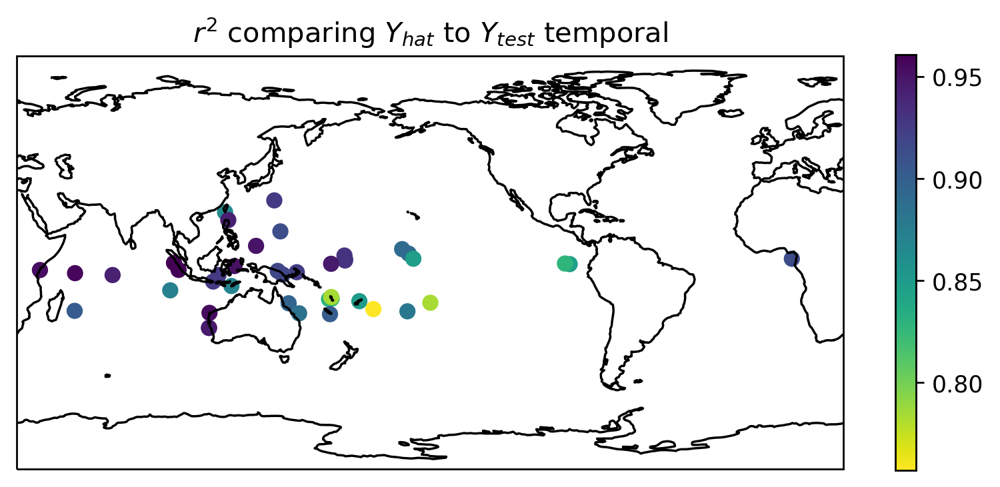

In [94]:
fig = plt.figure(figsize=(8,6), dpi=250)

ax = fig.add_subplot(1,1,1, projection=ccrs.PlateCarree(central_longitude=-150))

ax.add_feature(cfeature.COASTLINE)

ax.set_global()
plt.scatter(x=corals_lons, y=corals_lats,
            c= rsq,
            cmap = 'viridis_r',
            alpha=1,
            transform=ccrs.PlateCarree())
plt.colorbar(shrink=0.54)

plt.title('$r^2$ comparing $Y_{hat}$ to $Y_{test}$ temporal')
plt.show()

In [95]:
def time_axis(i):
    return np.linspace(corals_min_years[i], corals_max_years[i], num = len(get_salt_test(i)))

In [96]:
def time_axis_train(i):
    return np.linspace(2000, 2006, num = len(get_salt_train(i)))

In [97]:
min_inds = np.array(result_min_ind)
max_inds = np.array(result_max_ind)

In [98]:
def y_hat(i):
    x_tr_np = get_d18O_train(i).to_numpy()
    x_tr_np2d = x_tr_np.reshape(-1,1)
    train_fit = lr.fit(x_tr_np2d, get_salt_train(i))
    x_te_np = get_d18O_test(i).to_numpy()
    x_te_np2d = x_te_np.reshape(-1,1)
    return (train_fit.coef_ * x_te_np2d) + train_fit.intercept_

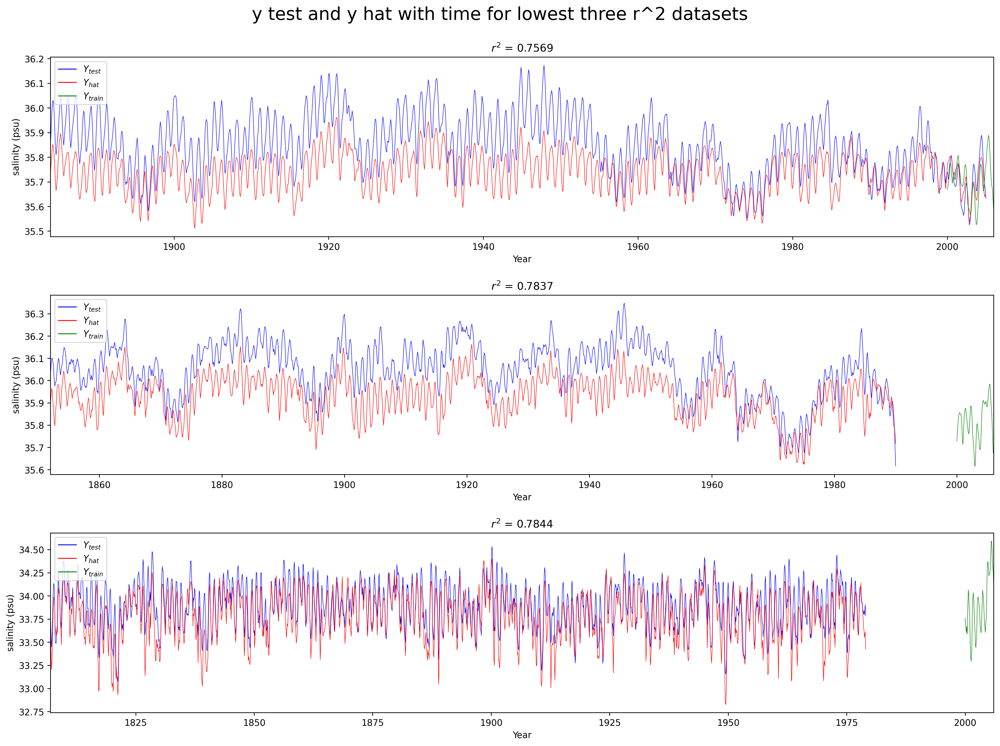

In [99]:
plt.figure(figsize=(16,12), dpi=250)
plt.suptitle('y test and y hat with time for lowest three r^2 datasets',fontsize=20)
from matplotlib.lines import Line2D
custom_lines = [Line2D([0], [0], color='blue', lw=1),
                Line2D([0], [0], color='red', lw=1),
                Line2D([0], [0], color='green', lw=1)]

for i in range(3):
    plt.subplot(3,1,i+1)
    plt.plot(time_axis(min_inds[i]), get_salt_test(min_inds[i]),linewidth=0.5,color='blue')
    plt.plot(time_axis(min_inds[i]), y_hat(min_inds[i]),linewidth=0.5,color='red')
    plt.plot(time_axis_train(min_inds[i]), get_salt_train(min_inds[i]), linewidth=0.5, color='green')
    plt.xlabel('Year')
    plt.ylabel('salinity (psu)')
    plt.title('$r^2$ = ' + str(round(rsq[min_inds[i]],4)))
    plt.legend(custom_lines, ['$Y_{test}$', '$Y_{hat}$', '$Y_{train}$'],loc='upper left') 
    plt.margins(x=0)
       

plt.tight_layout(pad=2.0)
plt.show()

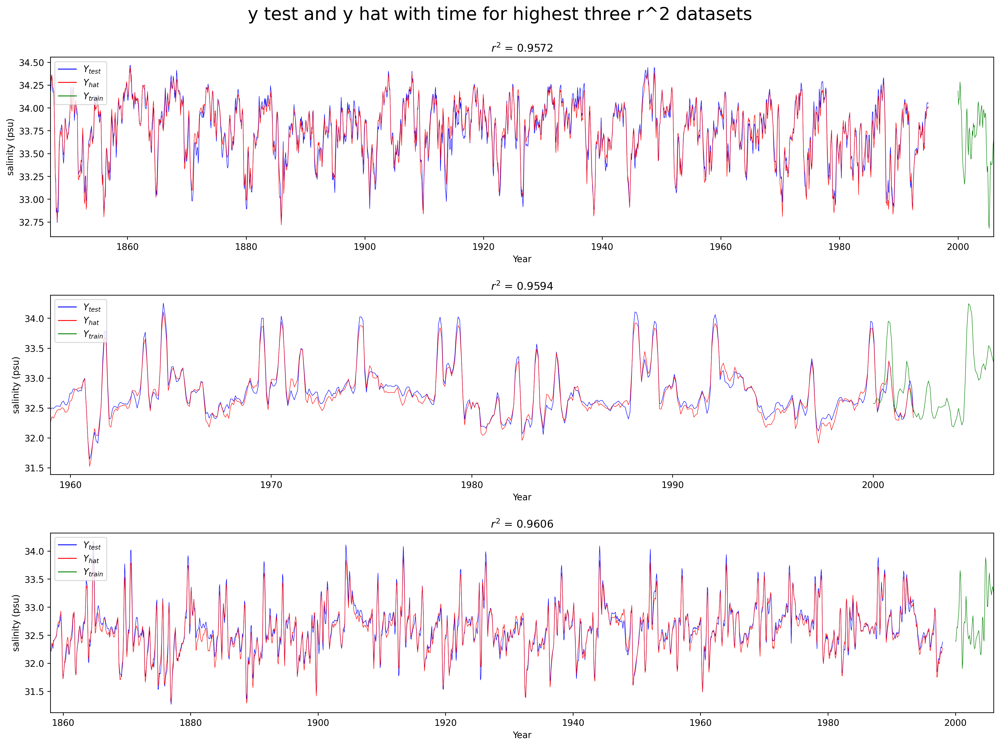

In [100]:
plt.figure(figsize=(16,12), dpi=250)
plt.suptitle('y test and y hat with time for highest three r^2 datasets',fontsize=20)

for i in range(3):
    plt.subplot(3,1,i+1)
    plt.plot(time_axis(max_inds[i]), get_salt_test(max_inds[i]),linewidth=0.5,color='blue')
    plt.plot(time_axis(max_inds[i]), y_hat(max_inds[i]),linewidth=0.5,color='red')
    plt.plot(time_axis_train(max_inds[i]), get_salt_train(max_inds[i]), linewidth=0.5, color='green')
    plt.xlabel('Year')
    plt.ylabel('salinity (psu)')
    plt.title('$r^2$ = ' + str(round(rsq[max_inds[i]],4)))
    plt.legend(custom_lines, ['$Y_{test}$', '$Y_{hat}$', '$Y_{train}$'],loc='upper left') 
    plt.margins(x=0)
    
plt.tight_layout(pad=2.0)
plt.show()

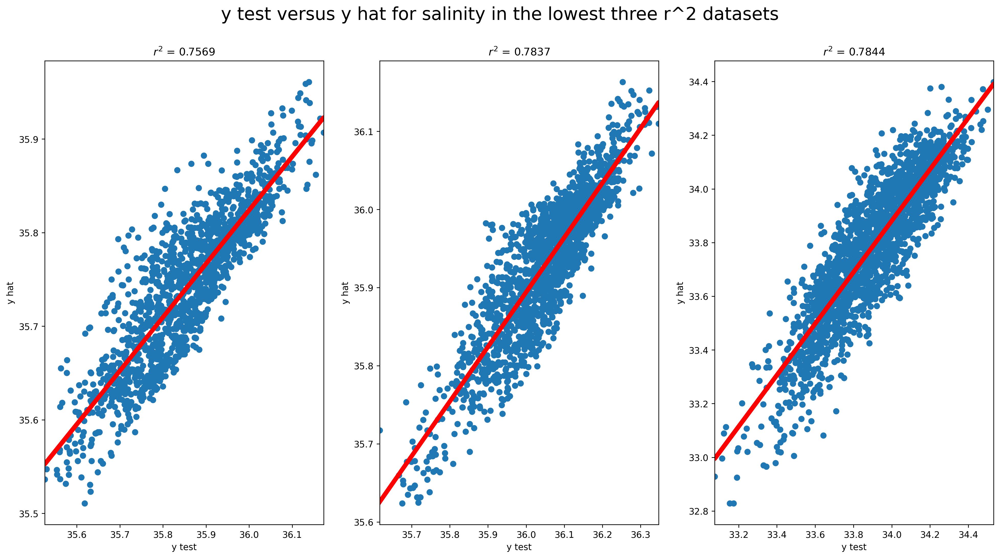

In [101]:
plt.figure(figsize=(16,9), dpi=250)
plt.suptitle('y test versus y hat for salinity in the lowest three r^2 datasets',fontsize=20)

for i in range(3):
    plt.subplot(1,3,i+1)
    plt.scatter(get_salt_test(min_inds[i]), y_hat(min_inds[i]))
    m, b = np.polyfit(get_salt_test(min_inds[i]), y_hat(min_inds[i]), 1)
    plt.plot(get_salt_test(min_inds[i]), m*get_salt_test(min_inds[i])+b,linewidth=5,color='r')
    plt.xlabel('y test')
    plt.ylabel('y hat')
    plt.title('$r^2$ = ' + str(round(rsq[min_inds[i]],4)))
    plt.margins(x=0)
    
plt.tight_layout(pad=2.0)
plt.show()

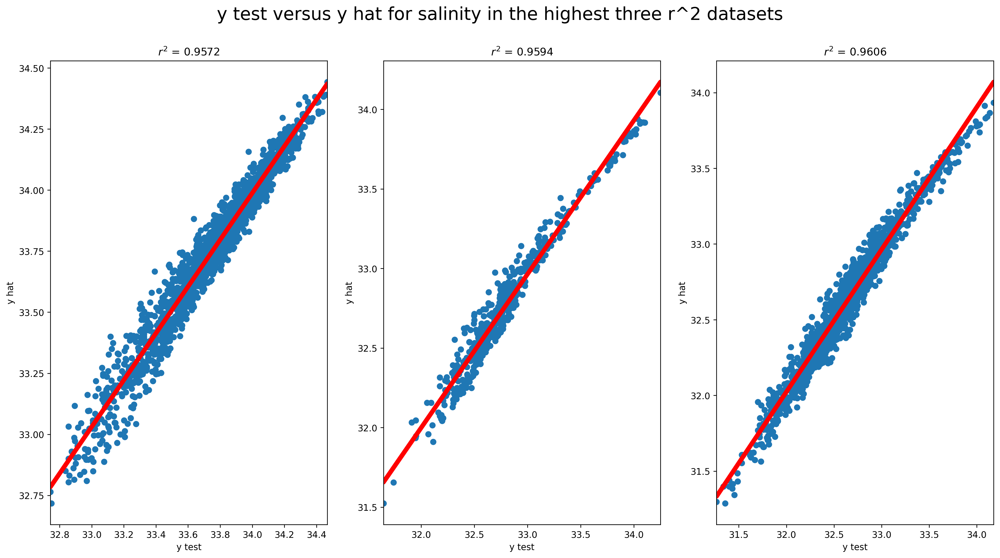

In [102]:
plt.figure(figsize=(16,9), dpi=250)
plt.suptitle('y test versus y hat for salinity in the highest three r^2 datasets',fontsize=20)

for i in range(3):
    plt.subplot(1,3,i+1)
    plt.scatter(get_salt_test(max_inds[i]), y_hat(max_inds[i]))
    m, b = np.polyfit(get_salt_test(max_inds[i]), y_hat(max_inds[i]), 1)
    plt.plot(get_salt_test(max_inds[i]), m*get_salt_test(max_inds[i])+b,linewidth=5,color='r')
    plt.xlabel('y test')
    plt.ylabel('y hat')
    plt.title('$r^2$ = ' + str(round(rsq[max_inds[i]],4)))
    plt.margins(x=0)
    
plt.tight_layout(pad=2.0)
plt.show()

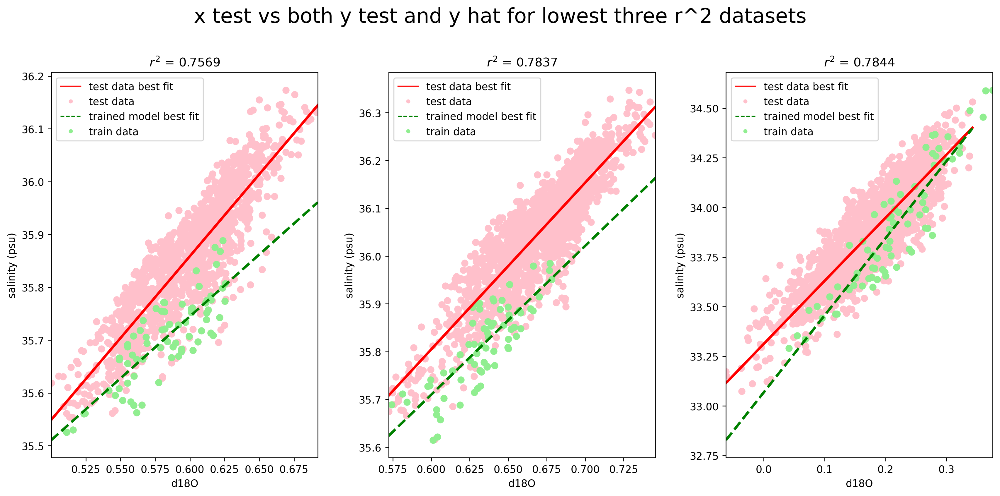

In [103]:
import seaborn as sb

plt.figure(figsize=(14,7), dpi=250)
plt.suptitle('x test vs both y test and y hat for lowest three r^2 datasets',fontsize=20)

legend_elements = [Line2D([0], [0], color='red', lw=1, label='test data best fit'),
                   Line2D([0], [0], marker='o', color='white', label='test data',
                          markerfacecolor='pink', markersize=5),
                   Line2D([0], [0], color='green', lw=1, linestyle='--',label='trained model best fit'),
                   Line2D([0], [0], marker='o', color='white', label='train data',
                          markerfacecolor='lightgreen', markersize=5)]

for i in range(3):
    plt.subplot(1,3,i+1)
    plt.scatter(get_d18O_test(min_inds[i]), get_salt_test(min_inds[i]),c='pink')
    plt.scatter(get_d18O_train(min_inds[i]), get_salt_train(min_inds[i]), c='lightgreen')
    sb.regplot(x=get_d18O_test(min_inds[i]), y=get_salt_test(min_inds[i]),ci=None,scatter=False,color='red',line_kws={"linewidth": 2.5})
    sb.regplot(x=get_d18O_test(min_inds[i]), y=y_hat(min_inds[i]),ci=None,scatter=False,color='green',line_kws={"linewidth": 2.5,"linestyle":"dashed"})
    plt.xlabel('d18O')
    plt.ylabel('salinity (psu)')
    plt.title('$r^2$ = ' + str(round(rsq[min_inds[i]],4)))
    plt.legend(handles=legend_elements, loc='upper left')
    plt.margins(x=0)

plt.tight_layout(pad=2.0)
plt.show()

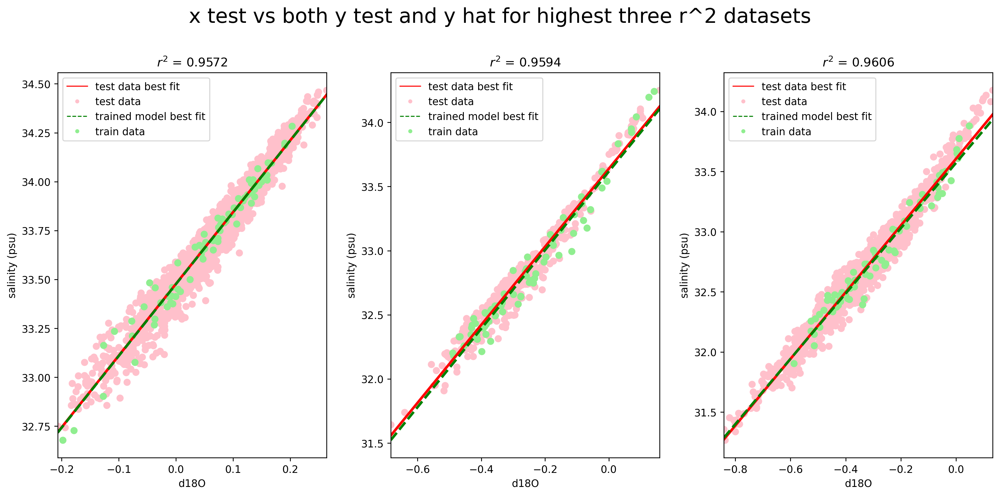

In [104]:
plt.figure(figsize=(14,7), dpi=250)
plt.suptitle('x test vs both y test and y hat for highest three r^2 datasets',fontsize=20)

for i in range(3):
    plt.subplot(1,3,i+1)
    plt.scatter(get_d18O_test(max_inds[i]), get_salt_test(max_inds[i]),c='pink')
    plt.scatter(get_d18O_train(max_inds[i]), get_salt_train(max_inds[i]), c='lightgreen')
    sb.regplot(x=get_d18O_test(max_inds[i]), y=get_salt_test(max_inds[i]),ci=None,scatter=False,color='red',line_kws={"linewidth": 2.5})
    sb.regplot(x=get_d18O_test(max_inds[i]), y=y_hat(max_inds[i]),ci=None,scatter=False,color='green',line_kws={"linewidth": 2.5,"linestyle":"dashed"})
    plt.xlabel('d18O')
    plt.ylabel('salinity (psu)')
    plt.title('$r^2$ = ' + str(round(rsq[max_inds[i]],4)))
    plt.legend(handles=legend_elements, loc='upper left')
    plt.margins(x=0)
    
plt.tight_layout(pad=2.0)
plt.show()

In [105]:
# def pluck_data(ds,lon_target,lat_target):
#     ind_lat=np.argmin(np.abs(ds.TLAT[:,0].values-lat_target))
#     ind_lon=np.argmin(np.abs(ds.TLONG[0,:].values-lon_target))
#     return ds[:,ind_lat,ind_lon]

def pluck_spatial(ds_salt, ds_d18O,lon_target,lat_target):
    ind_lat=np.argmin(np.abs(ds_salt.TLAT[:,0].values-lat_target))
    ind_lon=np.argmin(np.abs(ds_salt.TLONG[0,:].values-lon_target))

    d18O_list=np.array([])
    salt_list=np.array([])
    
    for ilat in range(ind_lat-3, ind_lat+4):
        for ilon in range(ind_lon-3, ind_lon+4):
            if np.isnan(ds_salt[:,ilat,ilon].to_numpy()).any() == False:
                salt_list = np.append(salt_list,ds_salt[:,ilat,ilon].to_numpy())
#                 print(len(ds_salt[:,ilat,ilon].to_numpy()))
            if np.isnan(ds_d18O[:,ilat,ilon].to_numpy()).any() == False:
                d18O_list = np.append(d18O_list,ds_d18O[:,ilat,ilon].to_numpy())
#                 print(len(ds_d18O[:,ilat,ilon].to_numpy()))
    return salt_list, d18O_list
            # if its not NAm append the salinity to the salinit list and a[[end d18 to the d18 list
    #convert the lists into an array 
    #estimate slope and intercept
            
            
            
    

In [106]:
def get_salt_d18O_test_spatial(i):
    #coral_d18O_test_data = np.array([])
    lat_target = corals_lats[i]
    lon_target = corals_lons[i]
    coral_salt_test_time = salt_all.sel(time=slice(corals_min_years_str[i], corals_max_years_str[i]))
    coral_d18O_test_time = d18O_all.sel(time=slice(corals_min_years_str[i], corals_max_years_str[i]))
    return pluck_spatial(coral_salt_test_time, coral_d18O_test_time, lon_target, lat_target)

In [107]:
get_salt_d18O_test_spatial(0)

(array([33.40420151, 33.31384277, 33.4219017 , ..., 33.90990829,
        33.91376495, 33.88935471]),
 array([-0.00548363, -0.0218153 , -0.0063777 , ...,  0.12469292,
         0.12516975,  0.11539459]))

In [108]:
def get_salt_d18O_train_spatial(i):
    lat_target = corals_lats[i]
    lon_target = corals_lons[i]
    return pluck_spatial(coral_salt_train_time,coral_d18O_train_time, lon_target, lat_target)

In [109]:
get_salt_d18O_train_spatial(0)

(array([34.16352463, 34.08904648, 34.23279572, ..., 33.61062622,
        33.60671234, 33.54403305]),
 array([0.1847744 , 0.16093254, 0.18763542, ..., 0.06520748, 0.05495548,
        0.02264977]))

In [110]:
def y_compare_spatial(i):
    x_tr_np = get_salt_d18O_train_spatial(i)[1]
#    if(np.isnan(x_tr_np).any()):
#        print("This array contains NaN values.")
#        return
    x_tr_np2d = x_tr_np.reshape(-1,1)
    train_fit = lr.fit(x_tr_np2d, get_salt_d18O_train_spatial(i)[0])
    x_te_np = get_salt_d18O_test_spatial(i)[1]
    x_te_np2d = x_te_np.reshape(-1,1)
    yhat = (train_fit.coef_ * x_te_np2d) + train_fit.intercept_
    compare = lr.fit(yhat, get_salt_d18O_test_spatial(i)[0])
    return compare.score(yhat, get_salt_d18O_test_spatial(i)[0])

In [111]:
y_compare_spatial(0)

0.9588106858671462

In [112]:
# temporal_options_spatial = np.array(['2006-01'])
# #temporal_options_spatial_longer = np.array(['2005-02', '2006-01'])

In [113]:
# def pluck_spatial_data(ds_salt, ds_d18O,lon_target,lat_target,g):
#     ind_lat=np.argmin(np.abs(ds_salt.TLAT[:,0].values-lat_target))
#     ind_lon=np.argmin(np.abs(ds_salt.TLONG[0,:].values-lon_target))

#     d18O_list=np.array([])
#     salt_list=np.array([])
    
#     for ilat in range(ind_lat-g, ind_lat+(g+1)):
#         for ilon in range(ind_lon-g, ind_lon+(g+1)):
#             if np.isnan(ds_salt[:,ilat,ilon].to_numpy()).any() == False:
#                 salt_list = np.append(salt_list,ds_salt[:,ilat,ilon].to_numpy())
#             if np.isnan(ds_d18O[:,ilat,ilon].to_numpy()).any() == False:
#                 d18O_list = np.append(d18O_list,ds_d18O[:,ilat,ilon].to_numpy())
#     return salt_list, d18O_list

In [114]:
# def spatial_compare(i, g):
#     coral_salt_train_spatial = salt_all.sel(time=temporal_options_spatial[0])
#     #coral_salt_train_spatial = salt_all.sel(time=slice(temporal_options_spatial_longer[0], temporal_options_spatial_longer[1]))
#     coral_d18O_train_spatial = d18O_all.sel(time=temporal_options_spatial[0])
#     #coral_d18O_train_spatial = d18O_all.sel(time=slice(temporal_options_spatial_longer[0], temporal_options_spatial_longer[1]))
    
#     lat_target = corals_lats[i]
#     lon_target = corals_lons[i]
    
#     plucked_spatial_train = pluck_spatial_data(coral_salt_train_spatial, coral_d18O_train_spatial,
#                                                    lon_target, lat_target, g)
    
#     coral_salt_test_spatial = salt_all.sel(time=slice(corals_min_years_str[i], corals_max_years_str[i]))
#     coral_d18O_test_spatial = d18O_all.sel(time=slice(corals_min_years_str[i], corals_max_years_str[i]))
    
#     plucked_salt_test_spatial = pluck_data(coral_salt_test_spatial, lon_target, lat_target)
#     plucked_d18O_test_spatial = pluck_data(coral_d18O_test_spatial, lon_target, lat_target)
    
#     x_train_np_s = plucked_spatial_train[1]
#     x_train_np_s_2d = x_train_np_s.reshape(-1,1)
#     train_data_fit_spatial = lr.fit(x_train_np_s_2d, plucked_spatial_train[0])
#     x_test_np_s = plucked_d18O_test_spatial.to_numpy()
#     x_test_np_s_2d = x_test_np_s.reshape(-1,1)
#     y_hat_spatial = (train_data_fit_spatial.coef_ * x_test_np_s_2d) + train_data_fit_spatial.intercept_
#     compare_y_spatial = lr.fit(y_hat_spatial, plucked_salt_test_spatial)
#     return compare_y_spatial.score(y_hat_spatial,plucked_salt_test_spatial)

In [115]:
# spatial_compare(10,3)

In [116]:
# temporal_compare(10,1)

In [117]:
y_compare(0)

0.9535978257959533

In [118]:
rsq_spatial = np.array([])
for i in range(43):
    rsq_spatial = np.append(rsq_spatial, y_compare_spatial(i))

In [119]:
sorted_ind_s = np.argsort(rsq_spatial)
sorted_rsq_s = rsq_spatial[sorted_ind_s]
result_min_ind_s = sorted_ind_s[:3]
result_max_ind_s = sorted_ind_s[-3:]
result_min_rsq_s = sorted_rsq_s[:3]
result_max_rsq_s = sorted_rsq_s[-3:]

In [120]:
print(result_min_ind_s, result_min_rsq_s)
print(result_max_ind_s, result_max_rsq_s)

[34 28 36] [0.78008451 0.78058729 0.78358644]
[ 0 35 15] [0.95881069 0.95896655 0.96008132]


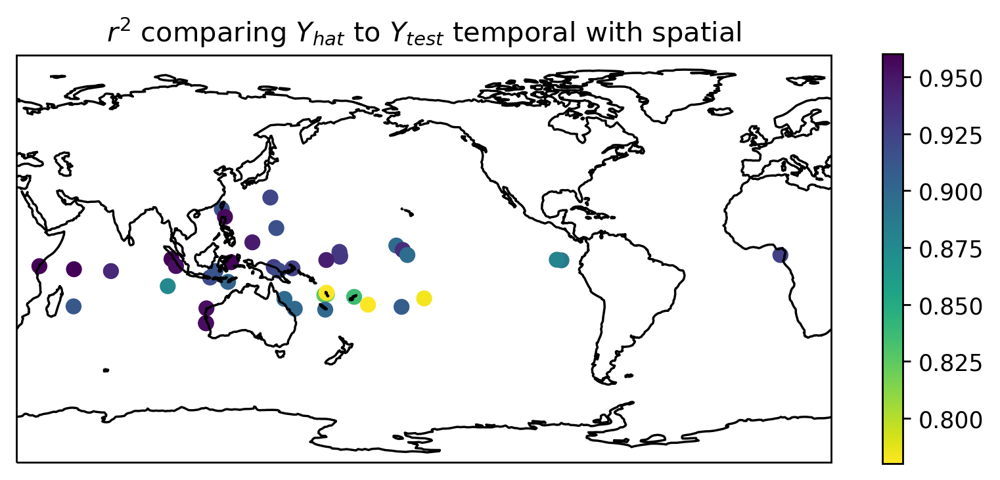

In [121]:
fig = plt.figure(figsize=(8,6), dpi=250)

ax = fig.add_subplot(1,1,1, projection=ccrs.PlateCarree(central_longitude=-150))

ax.add_feature(cfeature.COASTLINE)

ax.set_global()
plt.scatter(x=corals_lons, y=corals_lats,
            c= rsq_spatial,
            cmap = 'viridis_r',
            alpha=1,
            transform=ccrs.PlateCarree())
plt.colorbar(shrink=0.54)

plt.title('$r^2$ comparing $Y_{hat}$ to $Y_{test}$ temporal with spatial')
plt.show()

In [122]:
min_inds_s = np.array(result_min_ind_s)
max_inds_s = np.array(result_max_ind_s)

In [123]:
def y_hat_spatial(i):
    #x_tr_np = get_salt_d18O_train_spatial(i)[1].to_numpy()
    #x_tr_np2d = x_tr_np.reshape(-1,1)
    x_tr = get_salt_d18O_train_spatial(i)[1]
    x_tr_np2d = x_tr.reshape(-1,1)
    train_fit = lr.fit(x_tr_np2d, get_salt_d18O_train_spatial(i)[0])
    #x_te_np = get_salt_d18O_test_spatial(i)[1].to_numpy()
    #x_te_np2d = x_te_np.reshape(-1,1)
    x_te = get_salt_d18O_test_spatial(i)[1]
    x_te_np2d = x_te.reshape(-1,1)
    return (train_fit.coef_ * x_te_np2d) + train_fit.intercept_

In [124]:
#(y_hat_spatial(0)).shape[0]
#y_hat_spatial(5)

In [125]:
# def y_hat_mean_spatial(i):
#     y_shape = int((y_hat_spatial(min_inds_s[i])).shape[0])
#     x_shape = int(time_axis(min_inds_s[i]).shape[0])
#     ratio = y_shape / x_shape
#     ratio_int = int(ratio)
#     all_reshape = np.reshape((y_hat_spatial(min_inds_s[i])), (ratio_int, x_shape))
#     mean_reshape = np.array([])
#     for i in range(x_shape):
#         mean_reshape = np.append(mean_reshape, all_reshape[:,i].mean())
#     return mean_reshape
def y_hat_mean_spatial(i):
    y_shape = int(y_hat_spatial(i).shape[0])
    x_shape = int(time_axis(i).shape[0])
    ratio = y_shape / x_shape
    ratio_int = int(ratio)
    all_reshape = np.reshape((y_hat_spatial(i)), (ratio_int, x_shape))
    mean_reshape = np.array([])
    for i in range(x_shape):
        mean_reshape = np.append(mean_reshape, all_reshape[:,i].mean())
    return mean_reshape

In [126]:
#y_hat_mean_spatial(5)
#mean_spatial(2)

In [127]:
# def mean_spatial(i):
#     #(get_salt_d18O_test_spatial(0)[0]).shape
#     y_shape = int((get_salt_d18O_test_spatial(min_inds_s[i])[0]).shape[0])
#     x_shape = int(time_axis(min_inds_s[i]).shape[0])
#     ratio = y_shape / x_shape
#     ratio_int = int(ratio)
#     all_reshape = np.reshape((get_salt_d18O_test_spatial(min_inds_s[i])[0]), (ratio_int, x_shape))
#     mean_reshape = np.array([])
#     for i in range(x_shape):
#         mean_reshape = np.append(mean_reshape, all_reshape[:,i].mean())
#     return mean_reshape
def mean_spatial(i):
    #(get_salt_d18O_test_spatial(0)[0]).shape
    y_shape = int((get_salt_d18O_test_spatial(i)[0]).shape[0])
    x_shape = int(time_axis(i).shape[0])
    ratio = y_shape / x_shape
    ratio_int = int(ratio)
    all_reshape = np.reshape((get_salt_d18O_test_spatial(i)[0]), (ratio_int, x_shape))
    mean_reshape = np.array([])
    for i in range(x_shape):
        mean_reshape = np.append(mean_reshape, all_reshape[:,i].mean())
    return mean_reshape

In [128]:
#mean_spatial(5)
#time_axis_train(3).shape[0]

In [129]:
def mean_spatial_train(i):
    y_shape = int((get_salt_d18O_train_spatial(i)[0]).shape[0])
    x_shape = int(time_axis_train(i).shape[0])
    ratio = y_shape / x_shape
    ratio_int = int(ratio)
    all_reshape = np.reshape((get_salt_d18O_train_spatial(i)[0]), (ratio_int, x_shape))
    mean_reshape = np.array([])
    for i in range(x_shape):
        mean_reshape = np.append(mean_reshape, all_reshape[:,i].mean())
    return mean_reshape

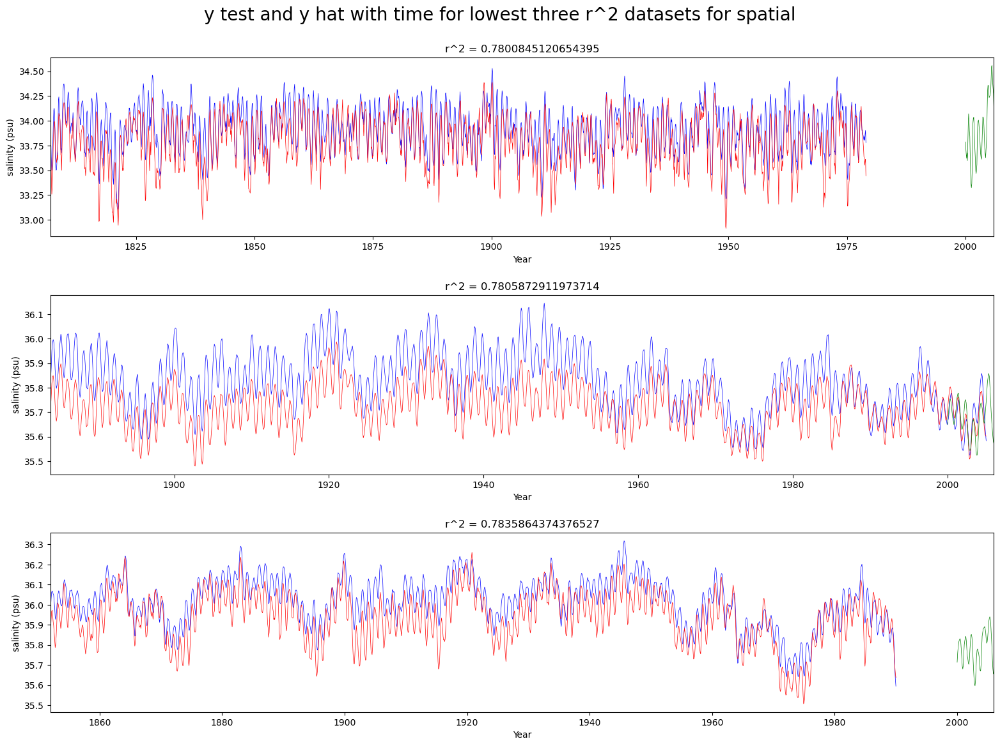

In [130]:
plt.figure(figsize=(16,12))
plt.suptitle('y test and y hat with time for lowest three r^2 datasets for spatial',fontsize=20)

for i in range(3):
    plt.subplot(3,1,i+1)
    plt.plot(time_axis(min_inds_s[i]), mean_spatial(min_inds_s[i]),linewidth=0.5,color='blue')
    plt.plot(time_axis(min_inds_s[i]), y_hat_mean_spatial(min_inds_s[i]),linewidth=0.5,color='red')
    plt.plot(time_axis_train(min_inds_s[i]), mean_spatial_train(min_inds_s[i]), linewidth=0.5, color='green')
    plt.xlabel('Year')
    plt.ylabel('salinity (psu)')
    plt.title('r^2 = ' + str(rsq_spatial[min_inds_s[i]]))
    plt.margins(x=0)
    
plt.tight_layout(pad=2.0)
plt.show()

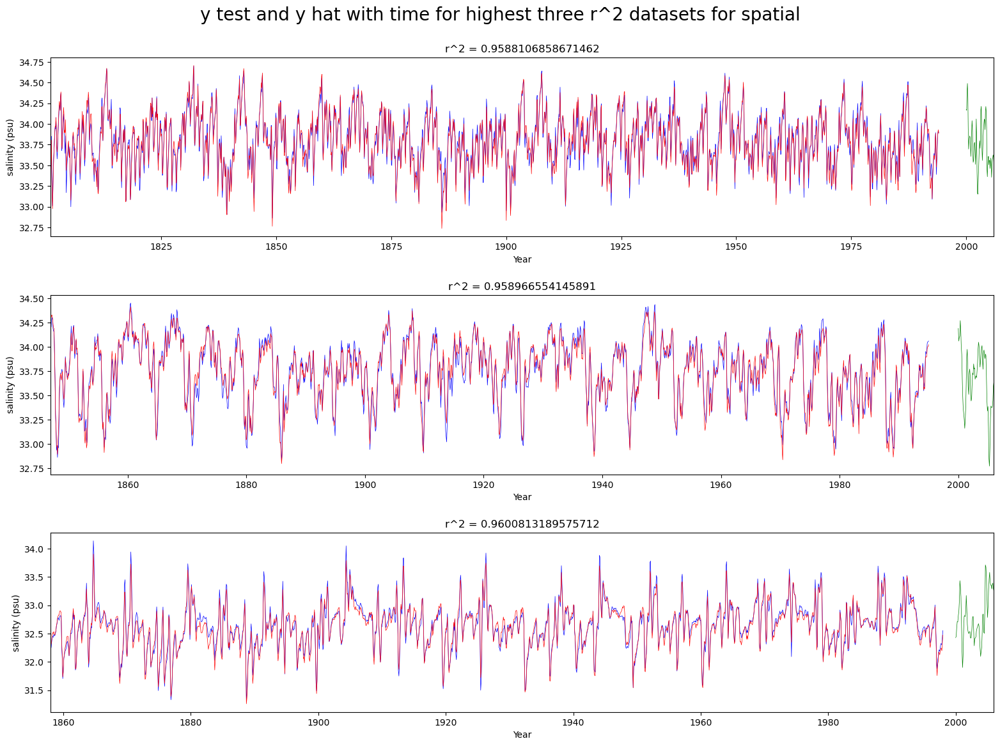

In [131]:
plt.figure(figsize=(16,12))
plt.suptitle('y test and y hat with time for highest three r^2 datasets for spatial',fontsize=20)

for i in range(3):
    plt.subplot(3,1,i+1)
    plt.plot(time_axis(max_inds_s[i]), mean_spatial(max_inds_s[i]),linewidth=0.5,color='blue')
    plt.plot(time_axis(max_inds_s[i]), y_hat_mean_spatial(max_inds_s[i]),linewidth=0.5,color='red')
    plt.plot(time_axis_train(max_inds_s[i]), mean_spatial_train(max_inds_s[i]), linewidth=0.5, color='green')
    plt.xlabel('Year')
    plt.ylabel('salinity (psu)')
    plt.title('r^2 = ' + str(rsq_spatial[max_inds_s[i]]))
    plt.margins(x=0)
    
plt.tight_layout(pad=2.0)
plt.show()

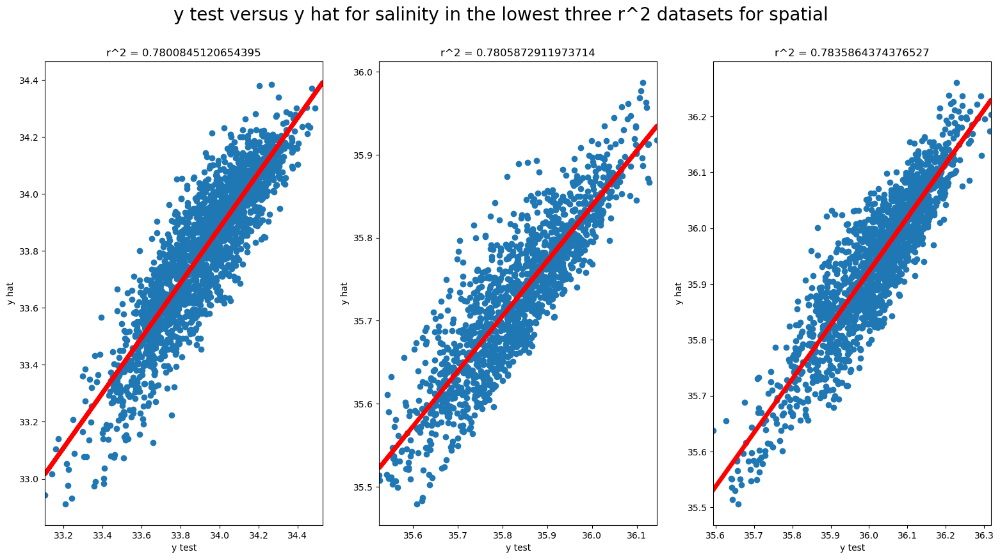

In [132]:
plt.figure(figsize=(16,9))
plt.suptitle('y test versus y hat for salinity in the lowest three r^2 datasets for spatial',fontsize=20)

for i in range(3):
    plt.subplot(1,3,i+1)
    plt.scatter(mean_spatial(min_inds_s[i]), y_hat_mean_spatial(min_inds_s[i]))
    m, b = np.polyfit(mean_spatial(min_inds_s[i]), y_hat_mean_spatial(min_inds_s[i]), 1)
    plt.plot(mean_spatial(min_inds_s[i]), m*mean_spatial(min_inds_s[i])+b,linewidth=5,color='r')
    plt.xlabel('y test')
    plt.ylabel('y hat')
    plt.title('r^2 = ' + str(rsq_spatial[min_inds_s[i]]))
    plt.margins(x=0)
    
plt.tight_layout(pad=2.0)
plt.show()

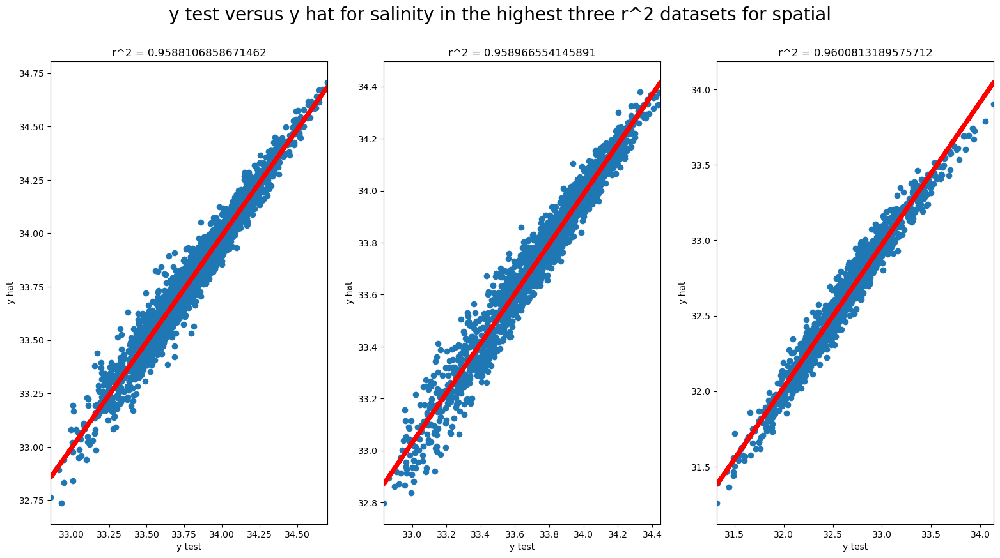

In [133]:
plt.figure(figsize=(16,9))
plt.suptitle('y test versus y hat for salinity in the highest three r^2 datasets for spatial',fontsize=20)

for i in range(3):
    plt.subplot(1,3,i+1)
    plt.scatter(mean_spatial(max_inds_s[i]), y_hat_mean_spatial(max_inds_s[i]))
    m, b = np.polyfit(mean_spatial(max_inds_s[i]), y_hat_mean_spatial(max_inds_s[i]), 1)
    plt.plot(mean_spatial(max_inds_s[i]), m*mean_spatial(max_inds_s[i])+b,linewidth=5,color='r')
    plt.xlabel('y test')
    plt.ylabel('y hat')
    plt.title('r^2 = ' + str(rsq_spatial[max_inds_s[i]]))
    plt.margins(x=0)
    
plt.tight_layout(pad=2.0)
plt.show()

In [134]:
def mean_spatial_d18O(i):
    #(get_salt_d18O_test_spatial(0)[0]).shape
    y_shape = int((get_salt_d18O_test_spatial(i)[1]).shape[0])
    x_shape = int(time_axis(i).shape[0])
    ratio = y_shape / x_shape
    ratio_int = int(ratio)
    all_reshape = np.reshape((get_salt_d18O_test_spatial(i)[1]), (ratio_int, x_shape))
    mean_reshape = np.array([])
    for i in range(x_shape):
        mean_reshape = np.append(mean_reshape, all_reshape[:,i].mean())
    return mean_reshape

In [135]:
def mean_spatial_train_d18O(i):
    y_shape = int((get_salt_d18O_train_spatial(i)[1]).shape[0])
    x_shape = int(time_axis_train(i).shape[0])
    ratio = y_shape / x_shape
    ratio_int = int(ratio)
    all_reshape = np.reshape((get_salt_d18O_train_spatial(i)[1]), (ratio_int, x_shape))
    mean_reshape = np.array([])
    for i in range(x_shape):
        mean_reshape = np.append(mean_reshape, all_reshape[:,i].mean())
    return mean_reshape

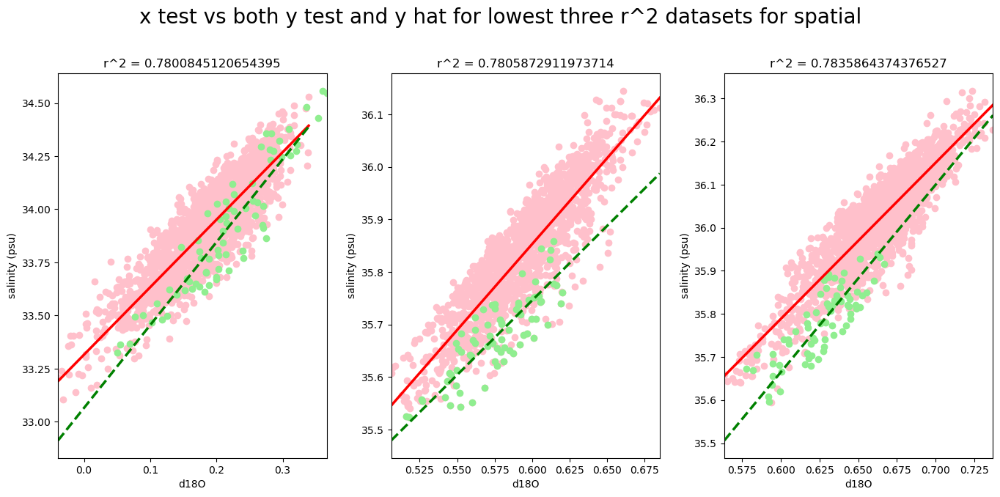

In [136]:
plt.figure(figsize=(14,7))
plt.suptitle('x test vs both y test and y hat for lowest three r^2 datasets for spatial',fontsize=20)

for i in range(3):
    plt.subplot(1,3,i+1)
    plt.scatter(mean_spatial_d18O(min_inds_s[i]), mean_spatial(min_inds_s[i]),c='pink')
    plt.scatter(mean_spatial_train_d18O(min_inds_s[i]), mean_spatial_train(min_inds_s[i]), c='lightgreen')
    sb.regplot(x=mean_spatial_d18O(min_inds_s[i]), y=mean_spatial(min_inds_s[i]),ci=None,scatter=False,color='red',line_kws={"linewidth": 2.5})
    sb.regplot(x=mean_spatial_d18O(min_inds_s[i]), y=y_hat_mean_spatial(min_inds_s[i]),ci=None,scatter=False,color='green',line_kws={"linewidth": 2.5,"linestyle":"dashed"})
    plt.xlabel('d18O')
    plt.ylabel('salinity (psu)')
    plt.title('r^2 = ' + str(rsq_spatial[min_inds_s[i]]))
    plt.margins(x=0)

plt.tight_layout(pad=2.0)
plt.show()

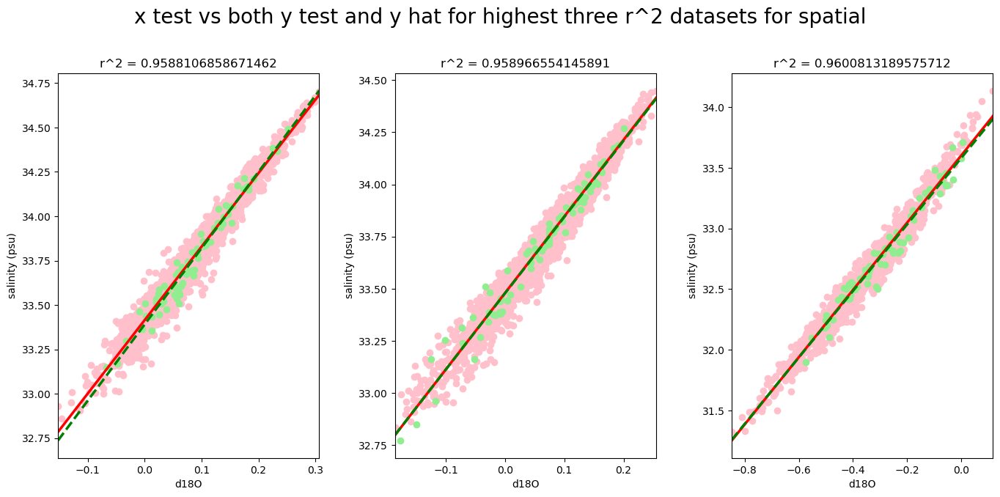

In [137]:
plt.figure(figsize=(14,7))
plt.suptitle('x test vs both y test and y hat for highest three r^2 datasets for spatial',fontsize=20)

for i in range(3):
    plt.subplot(1,3,i+1)
    plt.scatter(mean_spatial_d18O(max_inds_s[i]), mean_spatial(max_inds_s[i]),c='pink')
    plt.scatter(mean_spatial_train_d18O(max_inds_s[i]), mean_spatial_train(max_inds_s[i]), c='lightgreen')
    sb.regplot(x=mean_spatial_d18O(max_inds_s[i]), y=mean_spatial(max_inds_s[i]),ci=None,scatter=False,color='red',line_kws={"linewidth": 2.5})
    sb.regplot(x=mean_spatial_d18O(max_inds_s[i]), y=y_hat_mean_spatial(max_inds_s[i]),ci=None,scatter=False,color='green',line_kws={"linewidth": 2.5,"linestyle":"dashed"})
    plt.xlabel('d18O')
    plt.ylabel('salinity (psu)')
    plt.title('r^2 = ' + str(rsq_spatial[max_inds_s[i]]))
    plt.margins(x=0)

plt.tight_layout(pad=2.0)
plt.show()

In [138]:
# START OF FINALIZED FIGURES

<Figure size 1600x1200 with 0 Axes>

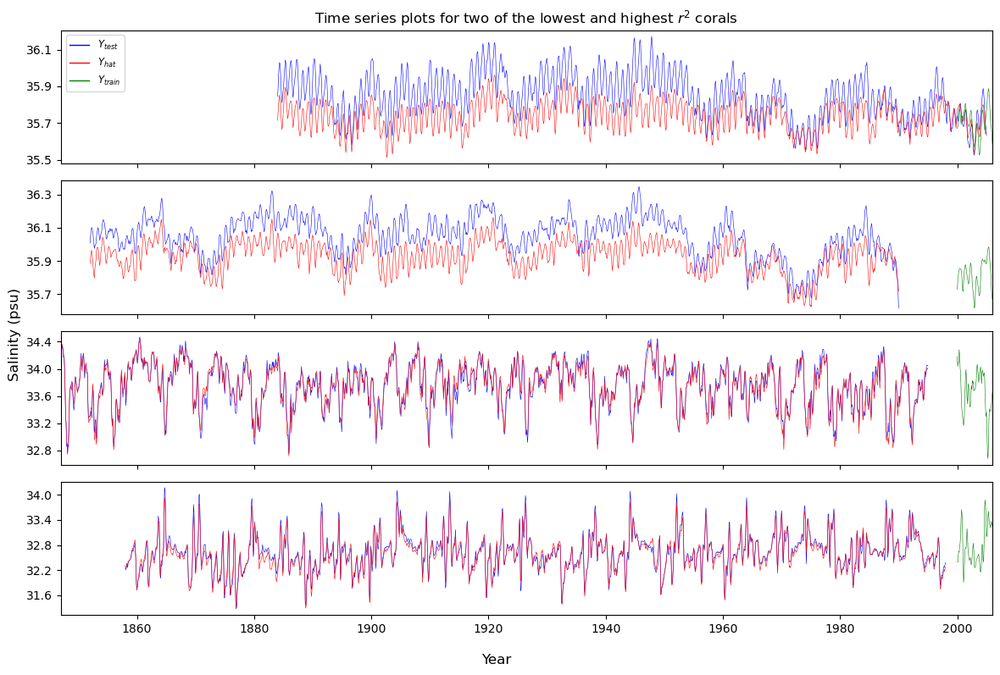

In [139]:
from matplotlib.lines import Line2D
custom_lines = [Line2D([0], [0], color='blue', lw=1),
                Line2D([0], [0], color='red', lw=1),
                Line2D([0], [0], color='green', lw=1)]
fig = plt.figure(figsize=(16,12))
f, (ax1, ax2, ax3, ax4) = plt.subplots(4, figsize=(12,8),sharex=True, sharey=False)

ax1.plot(time_axis(min_inds[0]), get_salt_test(min_inds[0]),linewidth=0.4,color='blue')
ax1.plot(time_axis(min_inds[0]), y_hat(min_inds[0]),linewidth=0.4,color='red')
ax1.plot(time_axis_train(min_inds[0]), get_salt_train(min_inds[0]), linewidth=0.4, color='green')
ax1.set_title('Time series plots for two of the lowest and highest $r^2$ corals')
ax1.yaxis.set_ticks(np.arange(35.5, 36.3, 0.2))
ax1.margins(x=0)
ax1.legend(custom_lines, ['$Y_{test}$', '$Y_{hat}$', '$Y_{train}$'],loc='upper left',fontsize='small')

ax2.plot(time_axis(min_inds[1]), get_salt_test(min_inds[1]),linewidth=0.4,color='blue')
ax2.plot(time_axis(min_inds[1]), y_hat(min_inds[1]),linewidth=0.4,color='red')
ax2.plot(time_axis_train(min_inds[1]), get_salt_train(min_inds[1]), linewidth=0.4, color='green')
ax2.yaxis.set_ticks(np.arange(35.70, 36.31, 0.20))
ax2.margins(x=0)

ax3.plot(time_axis(max_inds[0]), get_salt_test(max_inds[0]),linewidth=0.4,color='blue')
ax3.plot(time_axis(max_inds[0]), y_hat(max_inds[0]),linewidth=0.4,color='red')
ax3.plot(time_axis_train(max_inds[0]), get_salt_train(max_inds[0]), linewidth=0.4, color='green')
ax3.yaxis.set_ticks(np.arange(32.8, 34.41, 0.4))
ax3.margins(x=0)

ax4.plot(time_axis(max_inds[2]), get_salt_test(max_inds[2]),linewidth=0.4,color='blue')
ax4.plot(time_axis(max_inds[2]), y_hat(max_inds[2]),linewidth=0.4,color='red')
ax4.plot(time_axis_train(max_inds[2]), get_salt_train(max_inds[2]), linewidth=0.4, color='green')
ax4.yaxis.set_ticks(np.arange(31.6, 34.01, 0.6))
ax4.margins(x=0)

f.supxlabel('Year')
f.supylabel('Salinity (psu)')

f.subplots_adjust(hspace=0)
plt.setp([a.get_xticklabels() for a in f.axes[:-1]], visible=False)
plt.tight_layout()

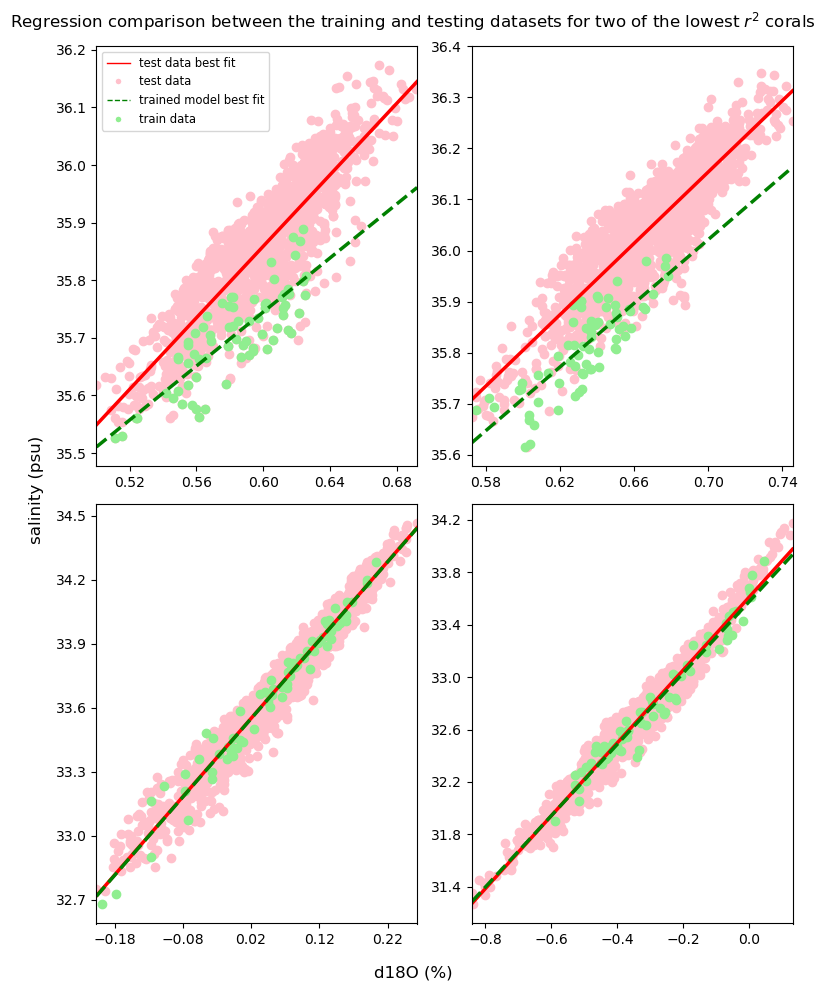

In [140]:
fig = plt.figure(figsize=(8,10))
plt.suptitle('Regression comparison between the training and testing datasets for two of the lowest $r^2$ corals')

legend_elements = [Line2D([0], [0], color='red', lw=1, label='test data best fit'),
                   Line2D([0], [0], marker='o', color='white', label='test data',
                          markerfacecolor='pink', markersize=5),
                   Line2D([0], [0], color='green', lw=1, linestyle='--',label='trained model best fit'),
                   Line2D([0], [0], marker='o', color='white', label='train data',
                          markerfacecolor='lightgreen', markersize=5)]

plt.subplot(2,2,1)
plt.scatter(get_d18O_test(min_inds[0]), get_salt_test(min_inds[0]),c='pink')
plt.scatter(get_d18O_train(min_inds[0]), get_salt_train(min_inds[0]), c='lightgreen')
sb.regplot(x=get_d18O_test(min_inds[0]), y=get_salt_test(min_inds[0]),ci=None,scatter=False,color='red',
           line_kws={"linewidth": 2.5})
sb.regplot(x=get_d18O_test(min_inds[0]), y=y_hat(min_inds[0]),ci=None,scatter=False,color='green',
           line_kws={"linewidth": 2.5,"linestyle":"dashed"})
plt.margins(x=0)
plt.legend(handles=legend_elements, loc='upper left',fontsize='small')
plt.xticks(np.arange(0.52, 0.681, 0.04))
plt.yticks(np.arange(35.5, 36.21, 0.1))
plt.xlabel(None)
plt.ylabel(None)

plt.subplot(2,2,2)
plt.scatter(get_d18O_test(min_inds[1]), get_salt_test(min_inds[1]),c='pink')
plt.scatter(get_d18O_train(min_inds[1]), get_salt_train(min_inds[1]), c='lightgreen')
sb.regplot(x=get_d18O_test(min_inds[1]), y=get_salt_test(min_inds[1]),ci=None,scatter=False,color='red',
           line_kws={"linewidth": 2.5})
sb.regplot(x=get_d18O_test(min_inds[1]), y=y_hat(min_inds[1]),ci=None,scatter=False,color='green',
           line_kws={"linewidth": 2.5,"linestyle":"dashed"})
plt.margins(x=0)
plt.xticks(np.arange(0.58, 0.75, 0.04))
plt.yticks(np.arange(35.6, 36.41, 0.1))
plt.xlabel(None)
plt.ylabel(None)

plt.subplot(2,2,3)
plt.scatter(get_d18O_test(max_inds[0]), get_salt_test(max_inds[0]),c='pink')
plt.scatter(get_d18O_train(max_inds[0]), get_salt_train(max_inds[0]), c='lightgreen')
sb.regplot(x=get_d18O_test(max_inds[0]), y=get_salt_test(max_inds[0]),ci=None,scatter=False,color='red',
           line_kws={"linewidth": 2.5})
sb.regplot(x=get_d18O_test(max_inds[0]), y=y_hat(max_inds[0]),ci=None,scatter=False,color='green',
           line_kws={"linewidth": 2.5,"linestyle":"dashed"})
plt.margins(x=0)
plt.xticks(np.arange(-0.18, 0.27, 0.1))
plt.yticks(np.arange(32.7, 34.51, 0.3))
plt.xlabel(None)
plt.ylabel(None)
    
plt.subplot(2,2,4)
plt.scatter(get_d18O_test(max_inds[2]), get_salt_test(max_inds[2]),c='pink')
plt.scatter(get_d18O_train(max_inds[2]), get_salt_train(max_inds[2]), c='lightgreen')
sb.regplot(x=get_d18O_test(max_inds[2]), y=get_salt_test(max_inds[2]),ci=None,scatter=False,color='red',
           line_kws={"linewidth": 2.5})
sb.regplot(x=get_d18O_test(max_inds[2]), y=y_hat(max_inds[2]),ci=None,scatter=False,color='green',
           line_kws={"linewidth": 2.5,"linestyle":"dashed"})
plt.margins(x=0)
plt.xticks(np.arange(-0.8, 0.06, 0.2))
plt.yticks(np.arange(31.4, 34.21, 0.4))
plt.xlabel(None)
plt.ylabel(None)


fig.supxlabel('d18O (%)')
fig.supylabel('salinity (psu)')
plt.tight_layout(pad=1)
plt.show()

In [141]:
# plt.plot(get_salt_d18O_train_spatial_7x7(38)[0],get_salt_d18O_train_spatial_7x7(38)[1],'.')

In [142]:
# plt.plot(get_salt_d18O_train_spatial_3x3(38)[0],get_salt_d18O_train_spatial_3x3(38)[1],'-')


In [143]:
# plt.plot(get_salt_train_25(38),get_d18O_train_25(38),'-')
# plt.plot(get_salt_d18O_train_spatial_3x3(38)[0],get_salt_d18O_train_spatial_3x3(38)[1],'-')

In [144]:
temporal_options_raw = np.array(['2000-01', '2006-01','1995-01', '2006-01','1980-01', '2006-01'])
temporal_options = np.reshape(temporal_options_raw, (3,2))

In [145]:
def temporal_compare(i, d):
    coral_salt_train = salt_all.sel(time=slice(temporal_options[d][0], temporal_options[d][1]))
    coral_d18O_train = d18O_all.sel(time=slice(temporal_options[d][0], temporal_options[d][1]))
    
    lat_target = corals_lats[i]
    lon_target = corals_lons[i]
    
    plucked_salt_train = pluck_data(coral_salt_train, lon_target, lat_target)
    plucked_d18O_train = pluck_data(coral_d18O_train, lon_target, lat_target)
    
    coral_salt_test = salt_all.sel(time=slice(corals_min_years_str[i], corals_max_years_str[i]))
    coral_d18O_test = d18O_all.sel(time=slice(corals_min_years_str[i], corals_max_years_str[i]))
    
    plucked_salt_test = pluck_data(coral_salt_test, lon_target, lat_target)
    plucked_d18O_test = pluck_data(coral_d18O_test, lon_target, lat_target)
    
    x_train_np = plucked_d18O_train.to_numpy()
    x_train_np_2d = x_train_np.reshape(-1,1)
    train_data_fit = lr.fit(x_train_np_2d, plucked_salt_train)
    x_test_np = plucked_d18O_test.to_numpy()
    x_test_np_2d = x_test_np.reshape(-1,1)
    y_hat = (train_data_fit.coef_ * x_test_np_2d) + train_data_fit.intercept_
    compare_y = lr.fit(y_hat, plucked_salt_test)
    return compare_y.score(y_hat, plucked_salt_test)

In [146]:
temporal_options_spatial = np.array(['2006-01'])
#temporal_options_spatial_longer = np.array(['2005-02', '2006-01'])

In [147]:
def pluck_spatial_data(ds_salt, ds_d18O,lon_target,lat_target,g):
    ind_lat=np.argmin(np.abs(ds_salt.TLAT[:,0].values-lat_target))
    ind_lon=np.argmin(np.abs(ds_salt.TLONG[0,:].values-lon_target))

    d18O_list=np.array([])
    salt_list=np.array([])
    
    for ilat in range(ind_lat-g, ind_lat+(g+1)):
        for ilon in range(ind_lon-g, ind_lon+(g+1)):
            if np.isnan(ds_salt[:,ilat,ilon].to_numpy()).any() == False:
                salt_list = np.append(salt_list,ds_salt[:,ilat,ilon].to_numpy())
            if np.isnan(ds_d18O[:,ilat,ilon].to_numpy()).any() == False:
                d18O_list = np.append(d18O_list,ds_d18O[:,ilat,ilon].to_numpy())
    return salt_list, d18O_list

In [148]:
def spatial_compare(i, g):
    coral_salt_train_spatial = salt_all.sel(time=temporal_options_spatial[0])
    #coral_salt_train_spatial = salt_all.sel(time=slice(temporal_options_spatial_longer[0], temporal_options_spatial_longer[1]))
    coral_d18O_train_spatial = d18O_all.sel(time=temporal_options_spatial[0])
    #coral_d18O_train_spatial = d18O_all.sel(time=slice(temporal_options_spatial_longer[0], temporal_options_spatial_longer[1]))
    
    lat_target = corals_lats[i]
    lon_target = corals_lons[i]
    
    plucked_spatial_train = pluck_spatial_data(coral_salt_train_spatial, coral_d18O_train_spatial,
                                                   lon_target, lat_target, g)
    
    coral_salt_test_spatial = salt_all.sel(time=slice(corals_min_years_str[i], corals_max_years_str[i]))
    coral_d18O_test_spatial = d18O_all.sel(time=slice(corals_min_years_str[i], corals_max_years_str[i]))
    
    plucked_salt_test_spatial = pluck_data(coral_salt_test_spatial, lon_target, lat_target)
    plucked_d18O_test_spatial = pluck_data(coral_d18O_test_spatial, lon_target, lat_target)
    
    x_train_np_s = plucked_spatial_train[1]
    x_train_np_s_2d = x_train_np_s.reshape(-1,1)
    train_data_fit_spatial = lr.fit(x_train_np_s_2d, plucked_spatial_train[0])
    x_test_np_s = plucked_d18O_test_spatial.to_numpy()
    x_test_np_s_2d = x_test_np_s.reshape(-1,1)
    y_hat_spatial = (train_data_fit_spatial.coef_ * x_test_np_s_2d) + train_data_fit_spatial.intercept_
    compare_y_spatial = lr.fit(y_hat_spatial, plucked_salt_test_spatial)
    return compare_y_spatial.score(y_hat_spatial,plucked_salt_test_spatial)

In [149]:
rsq_t_5 = np.array([])
for i in range(43):
    rsq_t_5 = np.append(rsq_t_5, temporal_compare(i,0))

rsq_t_10 = np.array([])
for i in range(43):
    rsq_t_10 = np.append(rsq_t_10, temporal_compare(i,1))

rsq_t_25 = np.array([])
for i in range(43):
    rsq_t_25 = np.append(rsq_t_25, temporal_compare(i,2))

rsq_spatial_3 = np.array([])
for i in range(43):
    rsq_spatial_3 = np.append(rsq_spatial_3, spatial_compare(i,1))

rsq_spatial_5 = np.array([])
for i in range(43):
    rsq_spatial_5 = np.append(rsq_spatial_5, spatial_compare(i,2))
    
rsq_spatial_7 = np.array([])
for i in range(43):
    rsq_spatial_7 = np.append(rsq_spatial_7, spatial_compare(i,3))

In [150]:
heatmap_rows_old = corals['geo_siteName']
heatmap_rows = heatmap_rows_old[: len(heatmap_rows_old) - 4]
heatmap_cols = ['5 year training', '10 year training', '25 year training',
               '3x3 spatial training', '5x5 spatial training', '7x7 spatial training']

heatmap_data_new = np.array([rsq_t_5,rsq_t_10,rsq_t_25,rsq_spatial_3, rsq_spatial_5, rsq_spatial_7])

df_heatmap_new = pd.DataFrame(np.transpose(heatmap_data_new))

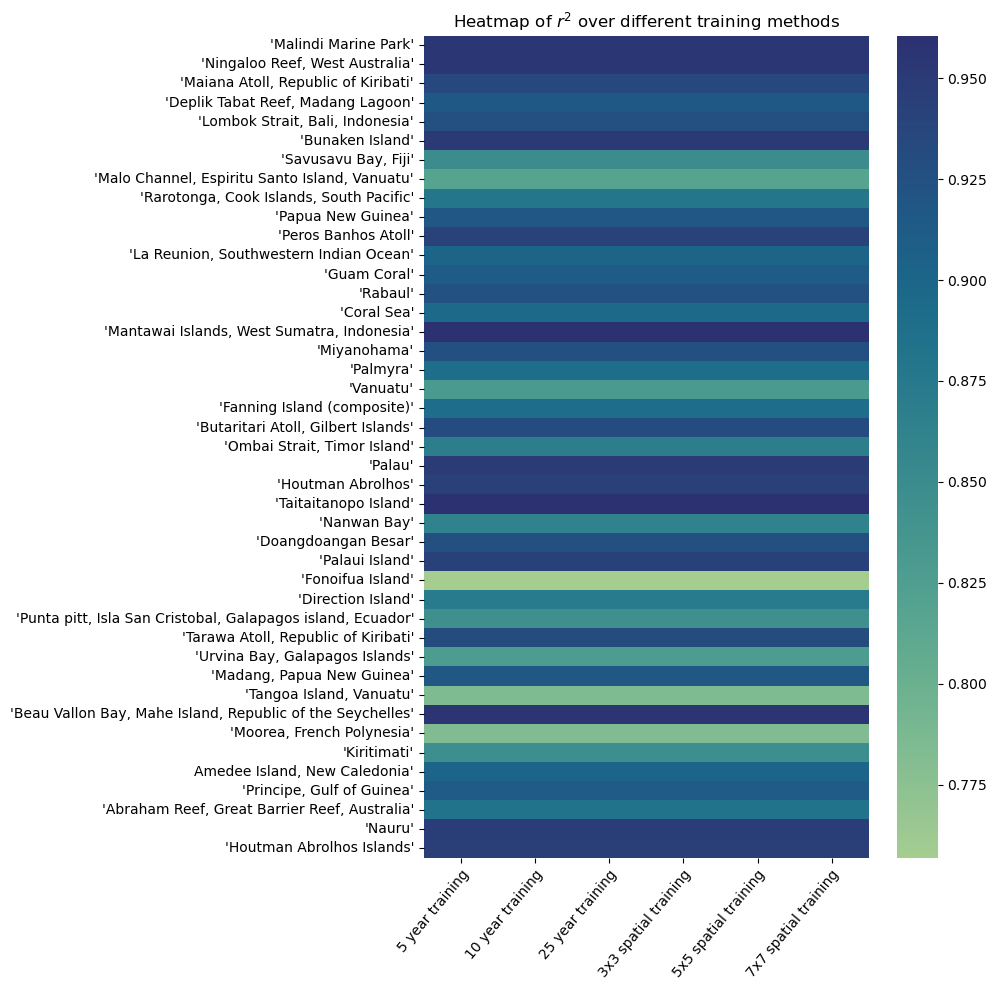

In [151]:
fig, ax = plt.subplots(figsize=(10, 10))
sb.heatmap(df_heatmap_new, xticklabels=heatmap_cols, yticklabels=heatmap_rows,cmap='crest')
plt.xticks(rotation=50,ha='right', rotation_mode='anchor')
plt.title('Heatmap of $r^2$ over different training methods')
plt.tight_layout()